In [1]:
import os
import re
import numpy as np
import pandas as pd
import seaborn as sns
import scipy
import itertools
import datetime

from matplotlib import pyplot as plt
from collections import Counter
from pprint import pprint
from rich import print as rprint
from log_utils import unroll
from itertools import combinations


custom_params = {
    "axes.spines.right": False, 
    "axes.spines.top": False
}
sns.set_theme(style="whitegrid", rc=custom_params)

In [2]:
def get_hms_from_total_time(s):
    hours = s // 3600
    mins = (s % 3600) // 60
    secs = (s % 3600) % 60
    return hours, mins, secs 

In [3]:
def str_to_list(x):
    try:
        return eval(x) if isinstance(x, str) else []
    except (ValueError, SyntaxError):
        return []

### Read FILES

In [4]:
task_level_smells = [
    'laborious_task',
    'cyclic_task',
    'too_many_layers',
    'missing_task_feedback',
    'high_interaction_distance',
    'repetition_in_text_fields',
    'late_validation',
]
action_level_smells = [
    'undescriptive_element',
    'missing_action_feedback',
    'unnecessary_action',
    'misleading_action',
]
all_smells = [*task_level_smells, *action_level_smells]

In [5]:
network_map = {
    'SN_1': 'SN1',
    'SN_2': 'SN2',
    'SN_3': 'SN3',
}


def read_dataset(dirpath):
    dfs = []
    for network in os.listdir(dirpath):
        for username in os.listdir(os.path.join(dirpath, network)):
            fname = os.path.join(dirpath, network, username, 'data.csv')
            df = pd.read_csv(fname, sep='\t')
            df['rtid'] = df['task_id'] / df['task_id'].max()
            dfs.append(df)
    return dfs


dfs = read_dataset('/media/mtreviso/flahd/Doutorado_Dados/UsabilitySmellsDataset_with_old_labels/')

# concat all dfs (columns not present in a df will be filled with NaNs)
df_all = pd.concat(dfs, ignore_index=True)

df_all

,network,username,pid,eid,rid,srid,event,task_id,unix_time,time,...,event_face_avg_4_contempt_proba,event_face_avg_5_sadness_proba,event_face_avg_6_surprise_proba,event_face_avg_most_likely,event_face_avg_entropy,event_face_avg_most_freq,event_face_lim_a,event_face_lim_b,sam_valence,sam_arousal
0,SN_1,P01,0,0,0.000000,0.000000,tabchange,0,1626098827503,1970-01-01 00:00:05.519000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,SN_1,P01,0,1,0.166667,0.007143,click,0,1626098856462,1970-01-01 00:00:34.478000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,SN_1,P01,0,2,0.333333,0.014286,click,0,1626098856778,1970-01-01 00:00:34.794000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,SN_1,P01,0,3,0.500000,0.021429,click,0,1626098857246,1970-01-01 00:00:35.262000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SN_1,P01,0,4,0.666667,0.028571,click,0,1626098858738,1970-01-01 00:00:36.754000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20045,SN_3,S08,34,2,1.000000,0.983122,click,16,1635458068247,1970-01-01 00:32:58.796000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20046,SN_3,S08,35,0,0.000000,0.987342,tabchange,16,1635458070942,1970-01-01 00:33:01.491000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20047,SN_3,S08,35,1,1.000000,0.991561,click,16,1635458070944,1970-01-01 00:33:01.493000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20048,SN_3,S08,36,0,1.000000,0.995781,tabchange,16,1635458071928,1970-01-01 00:33:02.477000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
networks = df_all['network'].unique().tolist()
usernames = df_all['username'].unique().tolist()

print('Total files read per social network:')
for net in networks:
    c = len(df_all[df_all['network'] == net]['username'].unique())
    print(f' "{net}": {c}')
    
print('Total: ', len(usernames))

Total files read per social network:
 "SN_1": 32
 "SN_2": 30
 "SN_3": 8
Total:  70


### Get set of valid labels for each network/user

In [7]:
valid_cols_per_network = {}

for idx, row in df_all.iterrows():
    network = row['network']
    username = row['username']
    labels_valid = eval(row['labels_valid'])
    if network not in valid_cols_per_network:
        valid_cols_per_network[network] = {}
    valid_cols_per_network[network][username] = list(sorted(labels_valid))

pprint(valid_cols_per_network)

{'SN_1': {'P01': [0, 1, 2],
          'P02': [0, 1, 2],
          'P03': [0, 1, 2],
          'P04': [0, 1, 2],
          'P05': [0, 1, 2],
          'P06': [0, 1, 2],
          'P07': [0, 1, 2],
          'P08': [0, 1, 2],
          'P09': [0, 1, 2],
          'P10': [0, 1, 2],
          'P11': [0, 1, 2],
          'P12': [0, 1, 2],
          'P13': [0, 1, 2],
          'P14': [0, 1, 2],
          'P15': [0, 1, 2],
          'P16': [0, 1, 2],
          'P17': [0, 1, 2],
          'P18': [0, 1, 2],
          'P19': [0, 1, 2],
          'P20': [0, 1, 2],
          'P21': [0, 1, 2],
          'P22': [0, 1, 2],
          'P23': [0, 1, 2],
          'P24': [0, 1, 2],
          'P25': [0, 1, 2],
          'P26': [0, 1, 2],
          'P27': [0, 1, 2],
          'P28': [0, 1, 2],
          'P29': [0, 1, 2],
          'P30': [0, 1, 2],
          'P31': [0, 1, 2],
          'P32': [0, 1, 2]},
 'SN_2': {'L01': [0, 1, 2],
          'L02': [0, 1, 2],
          'L03': [0, 1, 2],
          'L04': [0

#### Comparar valid_cols_per_network com a entrada manual

In [8]:
valid_cols_per_network_manual = {
    'SN_1': {
        "P01": [0,1,2],
        "P02": [0,1,2],
        "P03": [0,1,2],
        "P04": [0,1,2],
        "P05": [0,1,2],
        "P06": [0,1,2],
        "P07": [0,1,2],
        "P08": [0,1,2],
        "P09": [0,1,2],
        "P10": [0,1,2],
        "P11": [0,1,2],
        "P12": [0,1,2],
        "P13": [0,1,2],
        "P14": [0,1,2],
        "P15": [0,1,2],
        "P16": [0,1,2],
        "P17": [0,1,2],
        "P18": [0,1,2],
        "P19": [0,1,2],
        "P20": [0,1,2],
        "P21": [0,1,2],
        "P22": [0,1,2],
        "P23": [0,1,2],
        "P24": [0,1,2],
        "P25": [0,1,2],
        "P26": [0,1,2],
        "P27": [0,1,2],
        "P28": [0,1,2],
        "P29": [0,1,2],
        "P30": [0,1,2],
        "P31": [0,1,2],
        "P32": [0,1,2],
    },
    
    'SN_2': {
        "L01": [0,1,2],
        "L02": [0,1,2],
        "L03": [0,1,2],
        "L04": [0,1,2],
        "L05": [0,1,2],
        "L06": [0,1,2],
        "L07": [0,1,2],
        "L08": [0,1,2],
        "L09": [0,1,2],
        "L10": [0,1,2],
        "L11": [0,1,2],
        "L12": [0,1,2],
        "L13": [0,1,2],
        "L14": [0,1,2],
        "L15": [0,1,2],
        "L16": [0,1,2],
        "L17": [0,1,2],
        "L18": [0,1,2],
        "L19": [0,1,2],
        "L20": [0,1,2],
        "L21": [0,1,2],
        "L22": [0,1,2],
        "L23": [0,1,2],
        "L24": [0,1,2],
        "L25": [0,1,2],
        "L26": [0,1,2],
        "L27": [0,1,2],
        "L28": [0,1,2],
        "L29": [0,1,2],
        "L30": [0,1,2],
    },

    'SN_3': {
        "S01": [0,1,2],
        "S02": [0,1,2],
        "S03": [0,1,2],
        "S04": [0,1,2],
        "S05": [0,1,2],
        "S06": [0,1,2],
        "S07": [0,1,2],
        "S08": [0,1,2],
    },
}


In [9]:
def compare_networks(auto, manual):
    # Verifica se as redes são iguais
    if set(auto.keys()) != set(manual.keys()):
        return False, f"Redes diferentes: {set(auto.keys()) ^ set(manual.keys())}"

    for network in auto:
        # Verifica se os usuários são iguais para cada rede
        if set(auto[network].keys()) != set(manual[network].keys()):
            return False, f"Usuários diferentes na rede {network}: {set(auto[network].keys()) ^ set(manual[network].keys())}"

        for user in auto[network]:
            # Verifica se os valores para cada usuário são iguais
            if sorted(auto[network][user]) != sorted(manual[network][user]):
                return False, f"Valores diferentes para o usuário {user} na rede {network}: {auto[network][user]} != {manual[network][user]}"

    return True, "Os dicionários são iguais"

# Comparar os dois dicionários
are_equal, message = compare_networks(valid_cols_per_network, valid_cols_per_network_manual)

print(are_equal)
print(message)

True
Os dicionários são iguais


#### Informacoes sobre o df

In [10]:
list(df_all.columns)

['network',
 'username',
 'pid',
 'eid',
 'rid',
 'srid',
 'event',
 'task_id',
 'unix_time',
 'time',
 'url',
 'dom_object',
 'xpath',
 'labels_0',
 'labels_1',
 'labels_2',
 'labels_union',
 'labels_inter',
 'labels_valid',
 'finished_task',
 'event_duration',
 'event_cum_duration',
 'episode_click_duration',
 'episode_change_duration',
 'episode_scroll_duration',
 'episode_tabchange_duration',
 'episode_total_duration',
 'episode_click_num',
 'episode_change_num',
 'episode_scroll_num',
 'episode_tabchange_num',
 'episode_keypress_num',
 'episode_total_events',
 'event_click_text',
 'event_click_text_length',
 'event_click_button',
 'event_click_pos_x',
 'event_click_pos_y',
 'event_change_text',
 'event_change_text_length',
 'event_change_value',
 'event_change_value_sim_session',
 'event_change_value_sim_episode',
 'event_change_value_length',
 'event_keypress_num',
 'event_scroll_time',
 'event_scroll_num',
 'rtid',
 'episode_bit_eeg_signal_min',
 'episode_bit_eeg_signal_max',
 '

In [11]:
df_all['username'].unique()

array(['P01', 'P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09',
       'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18',
       'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25', 'P26', 'P27',
       'P28', 'P29', 'P30', 'P31', 'P32', 'L01', 'L02', 'L03', 'L04',
       'L05', 'L06', 'L07', 'L08', 'L09', 'L10', 'L11', 'L12', 'L13',
       'L14', 'L15', 'L16', 'L17', 'L18', 'L19', 'L20', 'L21', 'L22',
       'L23', 'L24', 'L25', 'L26', 'L27', 'L28', 'L29', 'L30', 'S01',
       'S02', 'S03', 'S04', 'S05', 'S06', 'S07', 'S08'], dtype=object)

In [12]:
df_all['event'].unique()

array(['tabchange', 'click', 'scroll', 'change', 'keypress'], dtype=object)

In [13]:
multilabels = []
all_labels = df_all['labels_0'].unique().tolist() + df_all['labels_1'].unique().tolist() + df_all['labels_2'].unique().tolist()

for x in df_all['labels_1'].unique():
    y = str(list(sorted(list(set(eval(x))))))
    if y not in multilabels:
        multilabels.append(y)

        
for x in sorted(multilabels, key=lambda x: len(eval(x))):
    print(len(eval(x)), eval(x))

0 []
1 ['misleading_action']
1 ['undescriptive_element']
1 ['missing_action_feedback']
1 ['late_validation']
1 ['too_many_layers']
1 ['unnecessary_action']
1 ['laborious_task']
1 ['missing_task_feedback']
1 ['high_interaction_distance']
1 ['cyclic_task']
2 ['laborious_task', 'late_validation']
2 ['laborious_task', 'too_many_layers']
2 ['misleading_action', 'undescriptive_element']
2 ['laborious_task', 'repetition_in_text_fields']
2 ['laborious_task', 'missing_task_feedback']
2 ['misleading_action', 'unnecessary_action']
2 ['cyclic_task', 'missing_task_feedback']
2 ['cyclic_task', 'laborious_task']
2 ['missing_task_feedback', 'too_many_layers']
2 ['misleading_action', 'missing_action_feedback']
2 ['missing_action_feedback', 'undescriptive_element']
2 ['high_interaction_distance', 'missing_task_feedback']
2 ['high_interaction_distance', 'laborious_task']
2 ['repetition_in_text_fields', 'too_many_layers']
2 ['late_validation', 'missing_task_feedback']
2 ['high_interaction_distance', 'too_

In [14]:
def check_labels_filled(df, label_columns):
    """
    Verifica se as colunas de labels estão devidamente preenchidas.
    
    Parâmetros:
    df (DataFrame): O DataFrame a ser verificado.
    label_columns (list): Lista das colunas de labels a serem verificadas.
    
    Retorna:
    None: Apenas imprime os resultados.
    """
    missing_data = df[label_columns].isnull().sum()
    if missing_data.sum() == 0:
        print("Todas as colunas de labels estão devidamente preenchidas.")
    else:
        print("As seguintes colunas de labels têm valores ausentes:")
        print(missing_data[missing_data > 0])
    
    for col in label_columns:
        unique_values = df[col].unique()
        #print(f"Valores únicos na coluna '{col}': {unique_values}")

# Lista das colunas de labels
label_columns = ['labels_0', 'labels_1', 'labels_2']

# Filtrar os dados para a network 'Love_Social'
df_love_social = df_all[df_all['network'] == 2]

# Chama a função para verificar as colunas de labels
#check_labels_filled(df_all, label_columns)

# Chama a função para verificar as colunas de labels
check_labels_filled(df_love_social, label_columns)

Todas as colunas de labels estão devidamente preenchidas.


# Basic counting statistics


CAUTION: the times shown here are just the duration of VALID event types, so the duration of tabchanges outside of perspective do not count.


In [15]:
from log_utils import read_json, get_timestamp_from_unix_time
import datetime

total_num_tasks = 0

networks = list(networks)
for network in networks + ['all']:
    
    if network == 'all':
        df = df_all
    else:
        df = df_all[df_all['network'] == network]
    
    users = df['username'].unique().tolist()

    print('Info for network: {}'.format(network))
    print('----------------')

    num_users = len(users)
    print('Number of users: {}'.format(num_users))

    num_tasks = df['task_id'].max()
    if network != 'all':
        total_num_tasks += num_tasks
        
    if network == 'all':
        num_tasks = total_num_tasks
    
    print('Number of tasks: {}'.format(num_tasks))
    
    x = np.array([sum((df['username'] == u) & (df['eid'] == 0)) for u in users])
    print('Number of episodes: {}'.format(x.sum()))
    print('Number of episodes per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))
    
    x = np.array([sum((df['username'] == u) & (df['event'] == 'tabchange')) for u in users])
    print('Number of tabchanges: {}'.format(x.sum()))
    print('Number of tabchanges per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))

    x = np.array([sum(df['username'] == u) for u in users])
    print('Number of events: {}'.format(x.sum()))
    print('Number of events per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))

    x = np.array([sum((df['username'] == u) & (df['event'] == 'click')) for u in users])
    print('Number of clicks: {}'.format(x.sum()))
    print('Number of clicks per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))

    x = np.array([sum((df['username'] == u) & (df['event'] == 'change')) for u in users])
    print('Number of input changes: {}'.format(x.sum()))
    print('Number of input changes per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))
    
    x = np.array([sum((df['username'] == u) & (df['event'] == 'keypress')) for u in users])
    print('Number of keypresses: {}'.format(x.sum()))
    print('Number of keypresses per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))

    x = np.array([sum((df['username'] == u) & (df['event'] == 'scroll')) for u in users])
    print('Number of scrolls: {}'.format(x.sum()))
    print('Number of scrolls per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))


    # pd.isna(df['bit_eeg_signal_min_tabchange'].iloc[0])
    x = np.array([((df['username'] == u) & (~pd.isna(df['event_bit_eeg_signal_min']))).any() for u in users])
    print('Number of EEG: {}'.format(x.sum()))
    print('Number of EEG per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))

    x = np.array([((df['username'] == u) & (~pd.isna(df['event_face_avg_entropy']))).any() for u in users])
    print('Number of Face Emotions: {}'.format(x.sum()))
    print('Number of Face Emotions per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))

    x = np.array([((df['username'] == u) & (~pd.isna(df['sam_valence']))).any() for u in users])
    print('Number of SAM: {}'.format(x.sum()))
    print('Number of SAM per user: {:.0f} ±{:.0f}'.format(x.mean(), x .std()))


    x = np.array([ sum( (df['username'] == u) & (df['eid'] == 0) & ( df['labels_union'].apply(lambda x: str_to_list(x) != ['none']) ) ) for u in users])
    print('Num. annotated episodes by at least 1 annotator: {}'.format(x.sum()))

    x = np.array([ sum( (df['username'] == u) & (df['eid'] == 0) & ( df['labels_inter'].apply(lambda x: str_to_list(x) != ['none'] and len(str_to_list(x)) > 0) ) ) for u in users])
    print('Num. annotated episodes by all anotators: {}'.format(x.sum()))

    x = np.array([ sum( (df['username'] == u) & (df['eid'] > 0) & ( df['labels_union'].apply(lambda x: str_to_list(x) != ['none'])  ) ) for u in users])
    print('Num. annotated events by at least 1 annotator: {}'.format(x.sum()))

    x = np.array([ sum( (df['username'] == u) & (df['eid'] > 0) & ( df['labels_inter'].apply(lambda x: str_to_list(x) != ['none'] and len(str_to_list(x)) > 0)  ) ) for u in users])
    print('Num. annotated events by all annotators: {}'.format(x.sum()))

    
    total_time = sum(df['event_duration'])  # in seconds
    hours, mins, secs = get_hms_from_total_time(total_time)
    print('Total interaction time: {:02.0f}:{:02.0f}:{:02.0f}'.format(hours, mins, secs))
    
    total_time = np.array([sum(df[df['username'] == u]['event_duration']) for u in users])  # in seconds
    hours, mins, secs = get_hms_from_total_time(total_time)
    print('Total interaction time per user: {:02.0f}:{:02.0f}:{:02.0f} ±{:02.0f}:{:02.0f}:{:02.0f}'.format(
        np.mean(hours), np.mean(mins), np.mean(secs), np.std(hours), np.std(mins), np.std(secs)))

    
    print('')
    

Info for network: SN_1
----------------
Number of users: 32
Number of tasks: 17
Number of episodes: 2085
Number of episodes per user: 65 ±17
Number of tabchanges: 2106
Number of tabchanges per user: 66 ±17
Number of events: 11615
Number of events per user: 363 ±96
Number of clicks: 5450
Number of clicks per user: 170 ±51
Number of input changes: 1877
Number of input changes per user: 59 ±13
Number of keypresses: 105
Number of keypresses per user: 3 ±4
Number of scrolls: 2077
Number of scrolls per user: 65 ±19
Number of EEG: 23
Number of EEG per user: 1 ±0
Number of Face Emotions: 22
Number of Face Emotions per user: 1 ±0
Number of SAM: 1
Number of SAM per user: 0 ±0
Num. annotated episodes by at least 1 annotator: 1784
Num. annotated episodes by all anotators: 561
Num. annotated events by at least 1 annotator: 1267
Num. annotated events by all annotators: 73
Total interaction time: 13:56:41
Total interaction time per user: 00:26:31 ±00:04:17

Info for network: SN_2
----------------
Num

# Exploring Durations

## Duration per event type

In [16]:
print('Times per event type')
print('--------------------')

for evt in ['tabchange', 'click', 'change']:
    total_time = sum(df_all[(df['event'] == evt)]['event_duration'])  # in seconds
    hours, mins, secs = get_hms_from_total_time(total_time)
    print('{} total duration: {:02.0f}:{:02.0f}:{:02.0f}'.format(
        evt, hours, mins, secs))

print('')

for evt in ['tabchange', 'click', 'change']:
    total_time = np.array([sum(df_all[(df_all['username'] == u) & (df_all['event'] == evt)]['event_duration']) for u in usernames])
    hours, mins, secs = get_hms_from_total_time(total_time)
    print('{} user average duration: {:02.0f}:{:02.0f}:{:02.0f} ±{:02.0f}:{:02.0f}:{:02.0f}'.format(
        evt, np.mean(hours), np.mean(mins), np.mean(secs), np.std(hours), np.std(mins), np.std(secs)))

Times per event type
--------------------
tabchange total duration: 04:33:28
click total duration: 08:47:43
change total duration: 05:35:14

tabchange user average duration: 00:03:31 ±00:03:17
click user average duration: 00:07:30 ±00:05:20
change user average duration: 00:04:29 ±00:03:16


## Distribution of the duration of each event per network and overall

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import LogFormatter
from matplotlib.lines import Line2D

SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize

text_map = {
    'click': 'Click',
    'tabchange': 'URL change',
    'scroll': 'Scroll',
    'change': 'Input change',
}

network_map = {
    'SN_1': 'SN1',
    'SN_2': 'SN2',
    'SN_3': 'SN3',
}


def network_name_to_title(net):
    return '-'.join(map(lambda s: s.capitalize(), net.replace('-', ' ').split()))


def plot_event_duration(df_all, plot_overall=True, linewidth=2, filename='event_types_duration_distribution.pdf', **kwargs):

    np = 3 + int(plot_overall)
    fig, axs = plt.subplots(1, np, figsize=(16, 4), sharey=True)
    dur_col = 'event_duration'
    all_networks = networks + ['all']
    
    for i, net in enumerate(all_networks[:np]):

        
        ax = axs[i]
        
        
        df = df_all[df_all['network'] == net].copy() if net != 'all' else df_all.copy()
        
        # scroll_rows = df['event'] == 'scroll'
        # n_scroll = sum(scroll_rows)
        # jitter = np.random.randn(n_scroll)
        # df.loc[scroll_rows, dur_col] = df[scroll_rows]['episode_scroll_duration'] / (df[scroll_rows]['episode_scroll_num']) + jitter  
        # tabchange_rows = df['event'] == 'tabchange'
        # df.loc[tabchange_rows, dur_col] = df[tabchange_rows]['episode_tabchange_duration']

        #Keypress nao tem duration, por isso eh filtrado aqui
        ignored_events = ['keypress']
        df = df[(~df['event'].isin(ignored_events)) & (df[dur_col] > 0)][[dur_col, 'event']]
        
        
        kwargs_sns = dict(
            bins=70,
            discrete=False,
            multiple="layer",
            log_scale=True,
            kde=True,
            stat='count',
            fill=True,
            alpha=0.0,
            palette='colorblind',
        )
        kwargs_sns.update(kwargs)
        alpha = kwargs_sns['alpha']
        
        g = sns.histplot(
            data=df, 
            x=dur_col, 
            hue='event', 
            hue_order=['click', 'tabchange', 'scroll', 'change'],
            ax=ax,
            legend=bool(i==0),
            # legend=True,
            **kwargs_sns
        )
        lss = ['-', '--', ':', '-.']
        for line, ls in zip(g.axes.lines, lss):
            line.set_linestyle(ls)
            line.set_linewidth(linewidth)
        
        if i == 0:

            if alpha == 0:
                handles = [
                    Line2D([0], [0], color=line.get_color(), linestyle=ls, linewidth=linewidth) 
                    for line, ls in zip(g.axes.lines[::-1], lss[::-1])
                ]
            
            else:
                handles = g.legend_.legend_handles
                for handle, ls in zip(handles, lss[::-1]):
                    handle.set_ls(ls)
                    handle.set_linewidth(1)
                    handle.set_alpha(1)
                    try:
                        handle.set_edgecolor('black')
                    except:
                        pass
            
            labels = [text_map[t.get_text()] for t in g.legend_.texts]


        t = network_map.get(net, net) if net in networks else 'Overall'   
        ax.set_title(t)
        ax.set_xlabel('Duration (s)')
        ax.set_ylabel('Frequency')
        if i > 0:
            ax.set_ylabel('')
    
        # Assuming you want the ticks at 0.01, 0.1, 1, 10, 100
        ticks = [0.01, 0.1, 1, 10, 100]
        ax.set_xticks(ticks)
        ax.set_xticklabels([str(t) for t in ticks])
    
        ax.grid(lw=0.45, linestyle=":", which='major')
    
    def get_in_order(handles, labels, order=None):
        order=['URL change', 'Click', 'Input change', 'Scroll']
        idxs = [(i, order.index(l)) for i, l in enumerate(labels)]
        new_handles = [handles[i] for i, _ in sorted(idxs, key=lambda x: x[1])]
        new_labels = [labels[i] for i, _ in sorted(idxs, key=lambda x: x[1])]
        return new_handles, new_labels
    
    ax = axs[0]    
    handles, labels = get_in_order(handles, labels)
    _ = ax.legend(handles, labels, 
                  loc='upper center', 
                  ncol=len(labels),
                  fontsize = 11,
                  bbox_to_anchor=(2.3, 1.28))  # left, bottom, width, height)
    
    print('saving to:', filename)
    plt.savefig(filename, bbox_inches='tight', dpi=300)

saving to: new_plots/event_types_duration_distribution_line.pdf


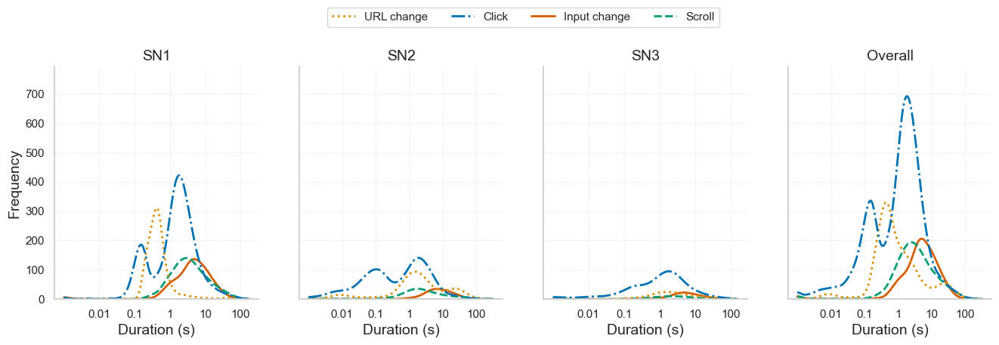

In [18]:
plot_event_duration(df_all, plot_overall=True, alpha=0, multiple='layer', bins=60,  #linewidth=2.25, 
                   filename='new_plots/event_types_duration_distribution_line.pdf')

saving to: new_plots/event_types_duration_distribution_fill.pdf


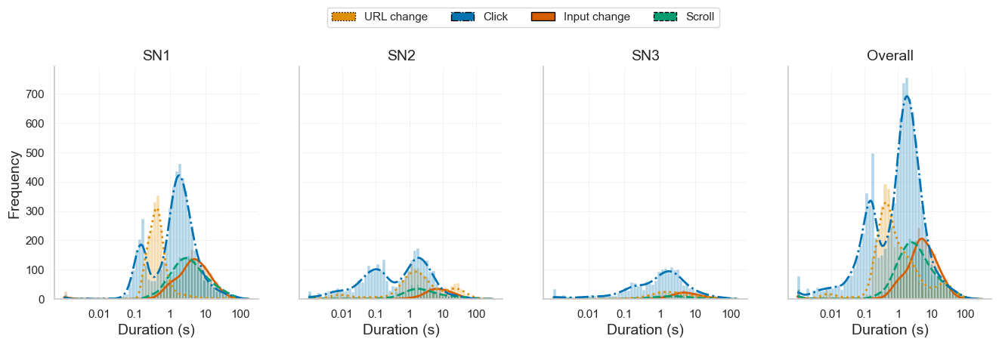

In [19]:
plot_event_duration(df_all, plot_overall=True, alpha=0.3, multiple='layer', bins=60,
                   filename='new_plots/event_types_duration_distribution_fill.pdf')

## Episode total duration per event type per network

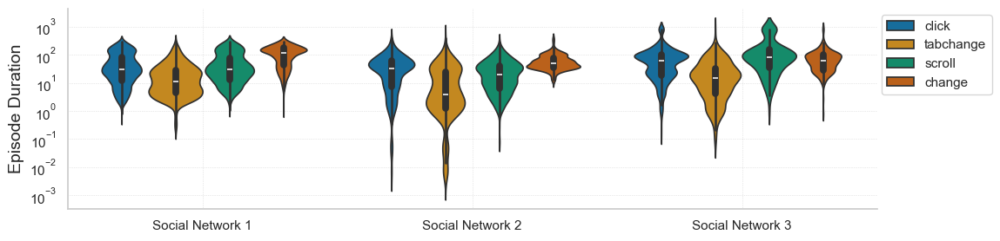

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(12, 3))

df_ep = df_all.copy()
#Keypress nao tem duration, por isso eh filtrado aqui
df_ep = df_ep[df_ep['event'] != 'keypress']
df_ep = df_ep[df_ep['episode_total_duration'] > 0]

sns.violinplot(
    data=df_ep, 
    x="network", 
    y="episode_total_duration", 
    hue="event",
    hue_order=['click', 'tabchange', 'scroll', 'change'],
    log_scale=True,
    palette='colorblind',
    ax=ax
)
ax.set_ylabel('Episode Duration')


ax.set_xlabel('')

ax.set_xticks([0, 1, 2])
ax.set_xticklabels([
    'Social Network 1',
    'Social Network 2',
    'Social Network 3',
])

_ = ax.legend(
    loc='upper right', 
    ncol=1,
    fontsize=11,
    bbox_to_anchor=(1.15, 1.0)
)  # left, bottom, width, height)

ax.grid(lw=0.45, linestyle=":", which='major')

plt.show()

## Distribution of the duration of Episode per network

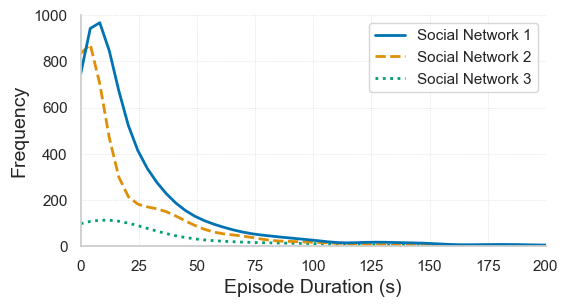

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))

df_ep = df_all[df_all['eid'] == 0]

alpha = 0
g = sns.histplot(
    data=df_ep, 
    x='episode_total_duration', 
    hue='network', 
    
    bins=50,
    discrete=False,
    multiple="layer",
    # log_scale=True,
    kde=True,
    stat='count',
    fill=True,
    alpha=alpha,
    palette='colorblind',

    ax=ax
)


lss = ['-', '--', ':'][::-1]
linewidth = 2.0

for line, ls in zip(g.axes.lines, lss):
    line.set_linestyle(ls)
    line.set_linewidth(linewidth)


if alpha == 0:
    handles = [Line2D([0], [0], color=line.get_color(), linestyle=ls, linewidth=linewidth) 
           for line, ls in zip(g.axes.lines[::-1], lss[::-1])]
else:
    handles = g.legend_.legend_handles[::-1]
    for handle, ls in zip(handles, lss[::-1]):
        handle.set_ls(ls)
        handle.set_linewidth(1)
        handle.set_alpha(1)
        try:
            handle.set_edgecolor('black')
        except:
            pass

text_map = {
    'SN_1': 'Social Network 1',
    'SN_2': 'Social Network 2',
    'SN_3': 'Social Network 3',
}
labels = [text_map[t.get_text()] for t in g.legend_.texts]


_ = ax.legend(
    handles, 
    labels, 
    loc='upper right', 
    ncol=1,
    fontsize=11,
    # bbox_to_anchor=(2.3, 1.28)
)  # left, bottom, width, height)

ax.set_xlim((0, 200))
ax.set_ylim((0, 1000))
ax.grid(lw=0.45, linestyle=":", which='major')

# ax.set_title(t)
ax.set_xlabel('Episode Duration (s)')
ax.set_ylabel('Frequency')

plt.savefig('new_plots/duration_distribution_of_episode_per_SN.pdf', bbox_inches='tight', dpi=300)
plt.show()

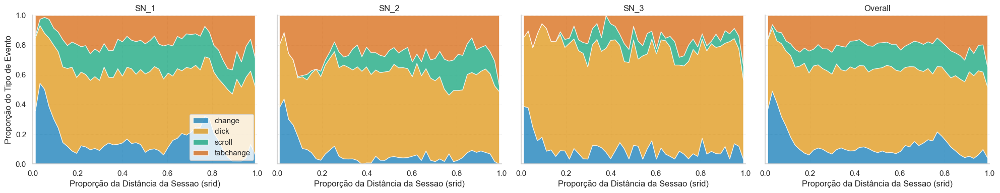

In [22]:
# Configurar o tema do Seaborn
sns.set_theme(style="whitegrid", palette="colorblind")

# Filtrar dados
df_ep = df_all.copy()
df_ep = df_ep[df_ep['event'] != 'keypress']
# df_ep = df_ep[df_ep['event'] != 'tabchange']
df_ep = df_ep[df_ep['episode_total_duration'] > 0]

# Definir a lista de redes
networks = ['SN_1', 'SN_2', 'SN_3']
n_plots = len(networks) + 1  # Um subplot para cada rede e um para o total

# Configurar os subplots
fig, axes = plt.subplots(1, n_plots, figsize=(20, 4), sharey=True)

# Função para criar o gráfico de área empilhado
def plot_stacked_area(df, ax, title):
    # Definir os intervalos de agrupamento
    bins = np.linspace(df['srid'].min(), df['srid'].max(), 50)
    
    # Agrupar por intervalos de 'srid' e 'event' e contar os eventos
    df = df.copy()  # Certifique-se de trabalhar em uma cópia do DataFrame
    df.loc[:, 'srid_binned'] = pd.cut(df['srid'], bins)
    df_counts = df.groupby(['srid_binned', 'event'], observed=False).size().unstack().fillna(0)
    
    # Normalizar as contagens para que cada linha some 1 (proporções)
    df_proportions = df_counts.div(df_counts.sum(axis=1), axis=0)
    
    # Calcular os centros dos bins para o eixo x
    x = df_proportions.index.categories.mid
    y = df_proportions.values.T
    
    labels = df_proportions.columns
    
    # Plotar as áreas empilhadas
    ax.stackplot(x, y, labels=labels, alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel('Proporção da Distância da Sessao (srid)')
    ax.set_xlim((0, 1))
    ax.set_ylim((0, 1))
    ax.grid(lw=0.45, linestyle=":", which='major')

# Plotar para cada rede
for i, network in enumerate(networks):
    df_network = df_ep[df_ep['network'] == network]
    plot_stacked_area(df_network, axes[i], f'{network}')

# Plotar para o total
plot_stacked_area(df_ep, axes[-1], 'Overall')

# Configurações finais
axes[0].set_ylabel('Proporção do Tipo de Evento')
axes[0].legend(
    loc='lower right', 
    # ncol=4,
    fontsize=11,
    # bbox_to_anchor=(1.0, 1.15)
)

sns.despine()
plt.tight_layout()
plt.show()

### Explore click positions 

1.9540117416829745


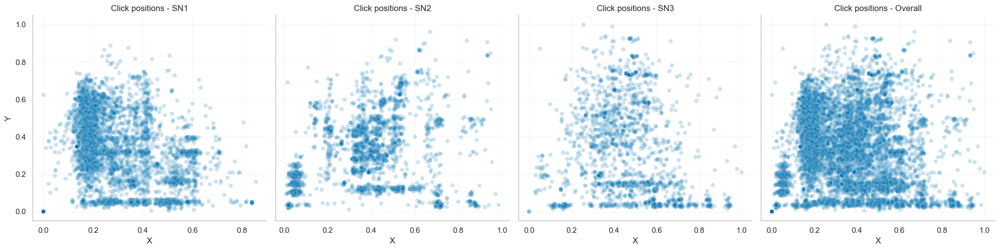

In [23]:
# 3.2 Scatter Plot da Posição do Click na Tela
df = df_all.copy()

# Verificar a proporção das posições
print(df['event_click_pos_x'].max() / df['event_click_pos_y'].max())

# Normalizar posições dos cliques
df['event_click_pos_x'] = df['event_click_pos_x'] / df['event_click_pos_x'].max()
df['event_click_pos_y'] = df['event_click_pos_y'] / df['event_click_pos_y'].max()

# Configurar subplots
fig, axs = plt.subplots(1, len(networks) + 1, figsize=(20, 5.12), sharey=True)

# Plot para cada rede
for i, network in enumerate(networks):
    sns.scatterplot(data=df[(df['event'] == 'click') & (df['network'] == network)], 
                    x='event_click_pos_x', y='event_click_pos_y', hue='event', 
                    alpha=0.2, legend=False, ax=axs[i])

    # Usando o mapeamento para o título
    network_title = network_map.get(network, network)
    axs[i].set_title(f'Click positions - {network_title}')
    axs[i].set_xlabel('X')
    if i == 0:
        axs[i].set_ylabel('Y')
    axs[i].grid(lw=0.45, linestyle=":", which='major')
    sns.despine(ax=axs[i])

# Plot geral
sns.scatterplot(data=df[df['event'] == 'click'], 
                x='event_click_pos_x', y='event_click_pos_y', hue='event', 
                alpha=0.2, legend=False, ax=axs[-1])
axs[-1].set_title('Click positions - Overall')
axs[-1].set_xlabel('X')
axs[-1].grid(lw=0.45, linestyle=":", which='major')
sns.despine(ax=axs[-1])

# Ajustar layout
plt.tight_layout()
plt.savefig('new_plots/click_positions_per_SN.pdf', bbox_inches='tight', dpi=300)
plt.show()

###  Análise de Texto em Eventos de Click e Change

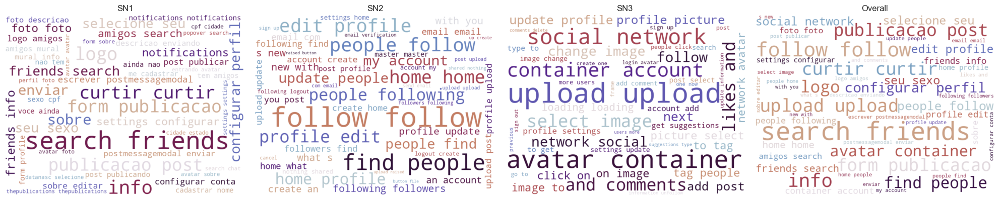

In [24]:
from wordcloud import WordCloud

# 5. Análise de Texto em Eventos de Click e Change
# 5.1 Word Cloud para Eventos de Click
df = df_all.copy()

# Configurar subplots
fig, axs = plt.subplots(1, len(networks) + 1, figsize=(20, 7))

# Função para gerar word cloud
def generate_wordcloud(text, ax, title):
    wordcloud = WordCloud(
        width=800, 
        height=600, 
        background_color='white',
        min_font_size=12,
        max_font_size=None,
        font_step=1,
        max_words=50,
        stopwords=['root', 'buttons'],
        colormap='twilight_shifted'
    ).generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

# Plot para cada rede
for i, network in enumerate(networks):
    click_text = ' '.join(df[(df['event'] == 'click') & (df['network'] == network)]['event_click_text'].dropna().astype(str))
    
    # Usando o mapeamento para o título
    network_title = network_map.get(network, network)
    generate_wordcloud(click_text, axs[i], f'{network_title}')

# Plot geral
click_text = ' '.join(df[df['event'] == 'click']['event_click_text'].dropna().astype(str))
generate_wordcloud(click_text, axs[-1], 'Overall')

# Ajustar layout
plt.tight_layout()

plt.savefig('new_plots/wordcloud_event_click_per_SN.pdf', bbox_inches='tight', dpi=300)
plt.show()

# Exploring Events

## Distribution of event types by network

In [25]:
# stacked bar plot do numero de eventos separados por tipo do evento para cada rede
df_bar = pd.DataFrame(columns=['event', 'count', 'network'])

for i, net in enumerate(networks):
    users = df_all[df_all['network'] == net]['username'].unique().tolist()
    for user in users:
        df = df_all[(df_all['network'] == net) & (df_all['username'] == user)]
        events = ['tabchange', 'change', 'click', 'scroll', 'keypress']
        
        # counts = [df['episode_'+e+'_num'].sum() for e in events]
        counts = [(df['event'] == e).sum() for e in events]
        
        data = [{ 'event': e, 'count': c, 'network': net, 'user': user} for e,c in zip(events, counts)]
        df_new = pd.DataFrame(data)
        df_bar = pd.concat([df_bar, df_new])

# Agrupando os dados e somando os contagens de eventos
new_df = df_bar.groupby(['network', 'event']).sum()
new_df = new_df.reset_index()
new_df = new_df[['network', 'event', 'count']]
new_df

,network,event,count
0,SN_1,change,1877
1,SN_1,click,5450
2,SN_1,keypress,105
3,SN_1,scroll,2077
4,SN_1,tabchange,2106
5,SN_2,change,416
6,SN_2,click,3027
7,SN_2,keypress,23
8,SN_2,scroll,603
9,SN_2,tabchange,1522


In [26]:
# Calculando as porcentagens de eventos para cada network
new_df['total'] = new_df.groupby('network')['count'].transform('sum')
new_df['percentage'] = (new_df['count'] / new_df['total']) * 100
new_df['p'] = (new_df['count'] / new_df['total'])

new_df

,network,event,count,total,percentage,p
0,SN_1,change,1877,11615,16.160138,0.161601
1,SN_1,click,5450,11615,46.922084,0.469221
2,SN_1,keypress,105,11615,0.904003,0.00904
3,SN_1,scroll,2077,11615,17.882049,0.17882
4,SN_1,tabchange,2106,11615,18.131726,0.181317
5,SN_2,change,416,5591,7.440529,0.074405
6,SN_2,click,3027,5591,54.140583,0.541406
7,SN_2,keypress,23,5591,0.411375,0.004114
8,SN_2,scroll,603,5591,10.78519,0.107852
9,SN_2,tabchange,1522,5591,27.222322,0.272223


In [27]:
# Calculando as porcentagens totais de eventos por tipo para todas as networks
total_counts = new_df.groupby('event')['count'].sum()
total_counts = total_counts.to_frame()
total_counts['network'] = 'Overall'
total_counts['total'] = total_counts['count'].sum()
total_counts['percentage'] = (total_counts['count'] / total_counts['total']) * 100
total_counts['p'] = (total_counts['count'] / total_counts['total'])

# Reordenando as colunas
total_counts = total_counts[['network', 'count', 'total', 'percentage', 'p']]
total_counts = total_counts.reset_index()

# Adicionando as porcentagens totais ao DataFrame original sem resetar o índice
new_df = pd.concat([new_df, total_counts], ignore_index=True)

new_df

,network,event,count,total,percentage,p
0,SN_1,change,1877,11615,16.160138,0.161601
1,SN_1,click,5450,11615,46.922084,0.469221
2,SN_1,keypress,105,11615,0.904003,0.00904
3,SN_1,scroll,2077,11615,17.882049,0.17882
4,SN_1,tabchange,2106,11615,18.131726,0.181317
5,SN_2,change,416,5591,7.440529,0.074405
6,SN_2,click,3027,5591,54.140583,0.541406
7,SN_2,keypress,23,5591,0.411375,0.004114
8,SN_2,scroll,603,5591,10.78519,0.107852
9,SN_2,tabchange,1522,5591,27.222322,0.272223


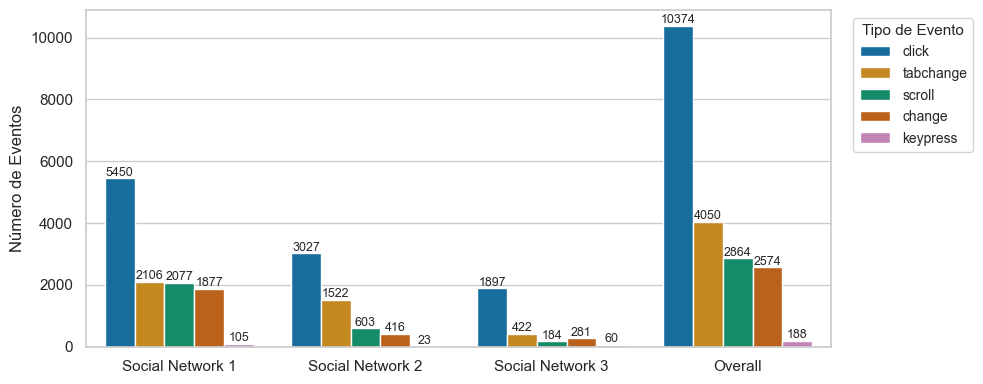

In [28]:
# Criando o gráfico de barras
plt.figure(figsize=(10, 4))

barplot = sns.barplot(
    data=new_df, 
    x='network', 
    y='count', 
    hue='event', 
    hue_order=['click', 'tabchange', 'scroll', 'change', 'keypress'],
    estimator=sum,
    palette='colorblind'
)

# Adicionando anotações de valores nas barras
for p in barplot.patches:
    height = p.get_height()
    if int(height) == 0:
        continue
    barplot.annotate(f'{int(height)}', 
                     (p.get_x() + p.get_width() / 2., height), 
                     ha='center', va='center', 
                     xytext=(0, 4),
                     textcoords='offset points',
                     fontsize=9  # Ajuste o tamanho da fonte conforme necessário
    )

# Personalizando os rótulos do eixo x
barplot.set_xlabel('')

barplot.set_xticks([0, 1, 2, 3])
barplot.set_xticklabels([
    'Social Network 1',
    'Social Network 2',
    'Social Network 3',
    'Overall',
])

plt.xlabel('')
plt.ylabel('Número de Eventos')

# Ajustando o tamanho da fonte da legenda
legend = barplot.legend(title='Tipo de Evento', bbox_to_anchor=(1.02, 1), loc='upper left')
legend.set_title('Tipo de Evento', prop={'size': 11})  # Tamanho da fonte do título da legenda
for text in legend.get_texts():
    text.set_fontsize(10)  # Tamanho da fonte dos itens da legenda

plt.tight_layout()

plt.savefig('new_plots/stacked_bar_plot_events_per_network.pdf', bbox_inches='tight', dpi=300)
plt.show()

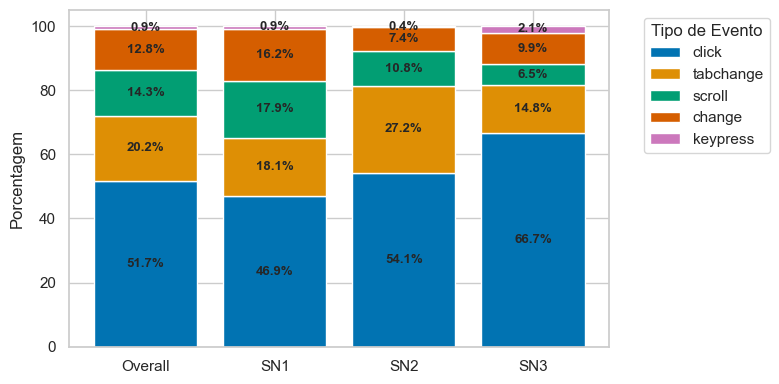

In [29]:
# Configurando o DataFrame para plotar barras empilhadas
stacked_df = new_df.pivot_table(
    index='network', 
    columns='event', 
    values='percentage', 
    aggfunc='sum'
).fillna(0)

stacked_df = stacked_df[['click', 'tabchange', 'scroll', 'change', 'keypress']]  # Garantir a ordem das colunas

# Criando o gráfico de barras empilhadas
fig, ax = plt.subplots(figsize=(8, 4))

bottom = pd.Series([0] * len(stacked_df), index=stacked_df.index)
colors = sns.color_palette('colorblind')

x = range(len(stacked_df.index))  # Posições das categorias

for i, event in enumerate(stacked_df.columns):
    bars = ax.bar(
        x, 
        stacked_df[event], 
        bottom=bottom, 
        label=event, 
        color=colors[i]
    )
    bottom += stacked_df[event]

    # Adicionando anotações de porcentagens nas barras
    for bar in bars:
        height = bar.get_height()
        if height > 0:  # Apenas anotar barras visíveis
            ax.annotate(
                f'{height:.1f}%', 
                (bar.get_x() + bar.get_width() / 2, bar.get_y() + height / 2), 
                ha='center', va='center', 
                fontsize=9.5, fontweight='bold',  # Ajuste do tamanho e negrito
                #color='white',
                xytext=(0, 0), 
                textcoords='offset points'
            )

# Ajustes do gráfico
ax.set_xlabel('')

ax.set_xticks([0, 1, 2, 3])
# ax.set_xticklabels([
#     'Social\nNetwork 1',
#     'Social\nNetwork 2',
#     'Social\nNetwork 3',
#     'Overall'
# ])
ax.set_xticklabels([
    'Overall',
    'SN1',
    'SN2',
    'SN3'
])

ax.set_ylabel('Porcentagem')

ax.legend(title='Tipo de Evento', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Salvando o gráfico
plt.savefig('new_plots/stacked_bar_plot_events_per_network_percentage.pdf', bbox_inches='tight', dpi=300)
plt.show()

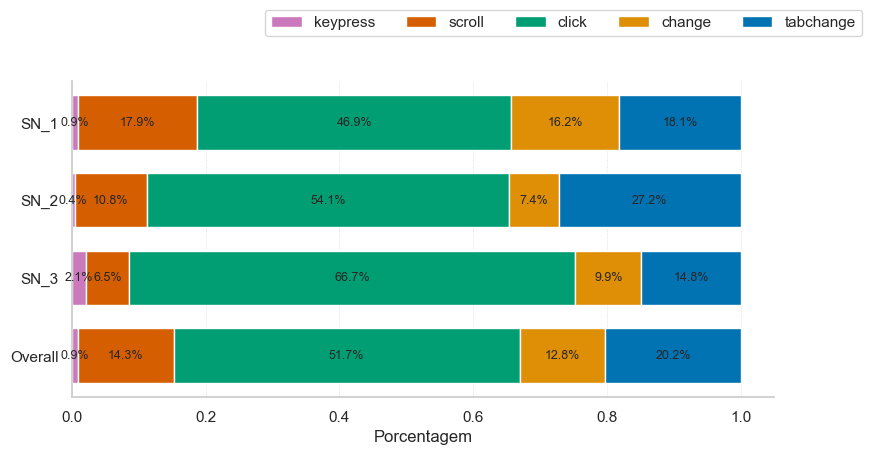

In [30]:
custom_params = {
    "axes.spines.right": False, 
    "axes.spines.top": False, 
    "grid.color": ".85", 
    "grid.linestyle": ":",
    "grid.linewidth": 0.6,
    "axes.grid.which": "major",
    "axes.grid.axis": "x"
}
sns.set_theme(style="whitegrid", rc=custom_params)
sns.set_palette('colorblind')

# Criando o gráfico de barras empilhadas usando sns.histplot
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
fig.tight_layout(pad=5)
hue_order = ['tabchange', 'change', 'click', 'scroll', 'keypress']

histplot = sns.histplot(
    data=new_df, 
    y='network', 
    weights='p',
    multiple='stack', 
    hue='event',
    hue_order=hue_order,
    ax=ax,
    palette='colorblind',
    shrink=0.7,
    legend=True,
    alpha=1
    #discrete=True
)

# Adicionando anotações de porcentagens nas barras
for p in histplot.patches:
    width = p.get_width()
    if width > 0:  # Apenas anotar barras visíveis
        histplot.annotate(f'{(100*width):.1f}%', 
                          (p.get_x() + width / 2., p.get_y() + p.get_height() / 2.), 
                          ha='center', va='center', 
                          xytext=(0, 0), 
                          textcoords='offset points',
                          fontsize=9)

#plt.title('Porcentagem de Eventos por tipo para cada rede')
ax.set_ylabel('')
ax.set_xlabel('Porcentagem')

# ax.yaxis.grid(True)  # Enable grid only on the y-axis
# ax.xaxis.grid(False)  # Disable grid on the x-axis


legend = ax.get_legend()
handles = legend.legend_handles[::-1]
labels = [t.get_text() for t in ax.legend_.texts][::-1]
title = ax.legend_.get_title().get_text()

legend.remove()

plt.tight_layout()
_ = ax.legend(handles, labels, 
              loc='upper center', 
              ncol=len(labels),
              bbox_to_anchor=(0.7, 1.25))  # left, bottom, width, height)
plt.savefig('new_plots/events_distribution.pdf', bbox_inches='tight', dpi=300)

---

# Exploring labels

- (todo) plotar distribuicao dos odores: para cada network e overall
- (todo) fazer plots da distribuicao de events por odor (stacked bars)
- (todo) fazer pairplots (ver algumas boas colunas)


## Distribution of smells per network and overall

#### Preparação do DataFrame para Análise

In [31]:
task_level_smells

['laborious_task',
 'cyclic_task',
 'too_many_layers',
 'missing_task_feedback',
 'high_interaction_distance',
 'repetition_in_text_fields',
 'late_validation']

In [32]:
s = set([e for l in df_all['labels_1'].unique() for e in str_to_list(l)])
s

{'cyclic_task',
 'high_interaction_distance',
 'laborious_task',
 'late_validation',
 'misleading_action',
 'missing_action_feedback',
 'missing_task_feedback',
 'repetition_in_text_fields',
 'too_many_layers',
 'undescriptive_element',
 'unnecessary_action'}

In [33]:
def prepare_smell_counts(df, smells, level='task'):
    smell_counts = {smell: [] for smell in smells}
    smell_counts['total_count'] = None
    smell_counts['network'] = []
    set_valid_smells = set(smells)
    
    networks = df['network'].unique()
    
    for network in networks:
        df_network = df[df['network'] == network]

        ann_smell_count = {smell: 0 for smell in smells}
        
        for username, valid_cols in valid_cols_per_network[network].items():
            df_user = df_network[df_network['username'] == username]

            if level == 'task':
                for task_id in range(18):
                    df_user_task = df_user[(df_user['task_id'] == task_id)]
                    if len(df_user_task) == 0:
                        continue
                    row_task = df_user_task.iloc[0]
                    for valid_col in valid_cols:
                        label_id = 'labels_{}'.format(valid_col)
                        for smell in smells:
                            ann_smells = str_to_list(row_task[label_id])
                            ann_smell_count[smell] += int(smell in ann_smells)
            else:
                for valid_col in valid_cols:
                    label_id = 'labels_{}'.format(valid_col)
                    for smell in smells:
                        ann_smell_count[smell] += df_user[label_id].apply(lambda x: 1 if smell in str_to_list(x) else 0).sum()
            
        for smell in smells:
            smell_counts[smell].append(ann_smell_count[smell])
        smell_counts['network'].append(network)
    

    new_df = pd.DataFrame(smell_counts)
    new_df['total_count'] = new_df[smells].sum(1)

    # add a new network named 'Overall' with the sum of all others
    sum_row = new_df.drop(columns=['network']).sum(0)    
    sum_row['network'] = 'Overall'
    sum_df = pd.DataFrame(sum_row).T
    new_df = pd.concat([new_df, sum_df], ignore_index=True)

    return new_df
        


In [34]:
def plot_smell_counts(df, smells, title):
    custom_params = {
        "axes.spines.right": False, 
        "axes.spines.top": False, 
        "grid.color": ".85", 
        "grid.linestyle": ":",
        "grid.linewidth": 0.6,
        "axes.grid.which": "major",
        "axes.grid.axis": "y",
    }
    sns.set_theme(style="whitegrid", rc=custom_params)
    
    value_name = ' ' #'Count'
    df_melted = df.melt(id_vars=['network'], value_vars=smells, var_name='Smell', value_name=value_name)

    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    
    barplot = sns.barplot(
        data=df_melted, 
        x='network', 
        y=value_name,
        hue='Smell',
        ax=ax,
        palette='colorblind',  # Use the colorblind palette
        dodge=True
    )


    for p in barplot.patches:
        height = p.get_height()
        if height > 0:  # Apenas anotar barras visíveis
            barplot.annotate(f'{int(height)}', 
                         (p.get_x() + p.get_width() / 2., height), 
                         ha='center', va='center', 
                         xytext=(0, 5), 
                         textcoords='offset points', fontsize=8)
    
    ax.set_ylabel(value_name)
    ax.set_xlabel('')

    # Fix the warning by explicitly setting the ticks before setting the labels
    ax.set_xticks([0, 1, 2, 3])  # Set the locations of the x-ticks
    ax.set_xticklabels([
    'SN1',
    'SN2',
    'SN3',
    'Overall'
    ])
    
    legend = ax.get_legend()
    handles = legend.legend_handles
    labels = [t.get_text() for t in ax.legend_.texts]
    title = ax.legend_.get_title().get_text()
    
    legend.remove()
    
    
    _ = ax.legend(handles, 
                  labels, 
                  loc='upper right', 
                  ncol=1,
                  fontsize=9,
                  bbox_to_anchor=(1.25, 1))  # left, bottom, width, height)

    ax.grid(lw=0.9, linestyle=":", which='major', axis='y')

    plt.tight_layout()

In [35]:
def plot_smell_distribution(df_input, smells, title):

    # convert to percentage
    df = df_input.copy()
    df[smells] = df[smells].div(df[smells].sum(axis=1), axis=0)

    custom_params = {
        "axes.spines.right": False, 
        "axes.spines.top": False, 
        "grid.color": ".85", 
        "grid.linestyle": ":",
        "grid.linewidth": 0.6,
        "axes.grid.which": "major",
        "axes.grid.axis": "x"
    }
    sns.set_theme(style="whitegrid", rc=custom_params)
    
    value_name = 'Percentage'
    df_melted = df.melt(id_vars=['network'], value_vars=smells, var_name='Smell', value_name=value_name)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    
    palette = sns.color_palette("colorblind", len(smells))
    networks = df['network'].unique()

    
    for network in networks:
        bottom = 0
        for i, smell in enumerate(smells):
            subset = df_melted[(df_melted['network'] == network) & (df_melted['Smell'] == smell)]
            if not subset.empty:
                value = subset[value_name].values[0]
                bar = ax.barh(network, value, left=bottom, color=palette[i], alpha=0.9)
                ax.annotate(f'{(100*value):.1f}%', 
                            (bottom + value / 2, bar[0].get_y() + bar[0].get_height() / 2), 
                            ha='center', va='center', 
                            xytext=(0, 0), 
                            textcoords='offset points',
                            fontsize=9)
                bottom += value

    # Create a custom legend
    handles = [plt.Rectangle((0,0),1,1, color=palette[i]) for i in range(len(smells))]
    labels = smells
    
    ax.set_xlabel(value_name)
    ax.set_ylabel('')

    # Fix the warning by explicitly setting the ticks before setting the labels
    ax.set_yticks([0, 1, 2, 3])  # Set the locations of the x-ticks
    ax.set_yticklabels([
    'SN1',
    'SN2',
    'SN3',
    'Overall'
    ])
    
    ax.legend(handles, labels, 
            loc='upper center', 
            ncol=4,
            fontsize=9,
            bbox_to_anchor=(0.5, 1.5))  # left, bottom, width, height)

    ax.grid(lw=0.9, linestyle=":", which='major', axis='x')

    plt.tight_layout()
    # plt.savefig('new_plots/events_distribution.pdf', bbox_inches='tight', dpi=300)


### Task-Level Smells

In [36]:
task_level_df  = prepare_smell_counts(df_all, task_level_smells)
task_level_df

,laborious_task,cyclic_task,too_many_layers,missing_task_feedback,high_interaction_distance,repetition_in_text_fields,late_validation,total_count,network
0,326,114,103,371,58,71,234,1277,SN_1
1,145,25,51,96,69,5,48,439,SN_2
2,44,7,31,31,22,1,21,157,SN_3
3,515,146,185,498,149,77,303,1873,Overall


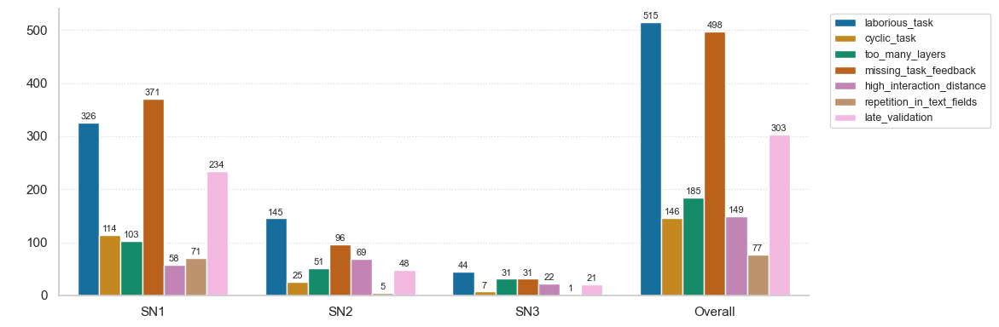

In [37]:
# Preparar a contagem absoluta
plot_smell_counts(task_level_df, task_level_smells, title='Count Distribution of Task-Level Smells per Network and Overall')
plt.savefig('new_plots/task_smells_distribution.pdf', bbox_inches='tight', dpi=300)

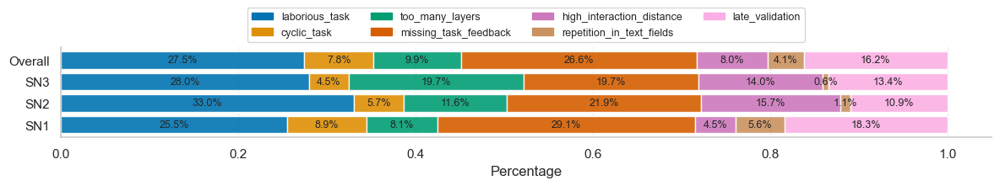

In [38]:
# Preparar a distribuição percentual
plot_smell_distribution(task_level_df, task_level_smells, 'Percentage Distribution of Task-Level Smells per Network and Overall')
plt.savefig('new_plots/task_smells_distribution_stacked.pdf', bbox_inches='tight', dpi=300)

### Action-level Smells

In [39]:
action_level_df  = prepare_smell_counts(df_all, action_level_smells, level='action')
action_level_df

,undescriptive_element,missing_action_feedback,unnecessary_action,misleading_action,total_count,network
0,212,633,65,987,1897,SN_1
1,192,458,75,526,1251,SN_2
2,45,78,14,51,188,SN_3
3,449,1169,154,1564,3336,Overall


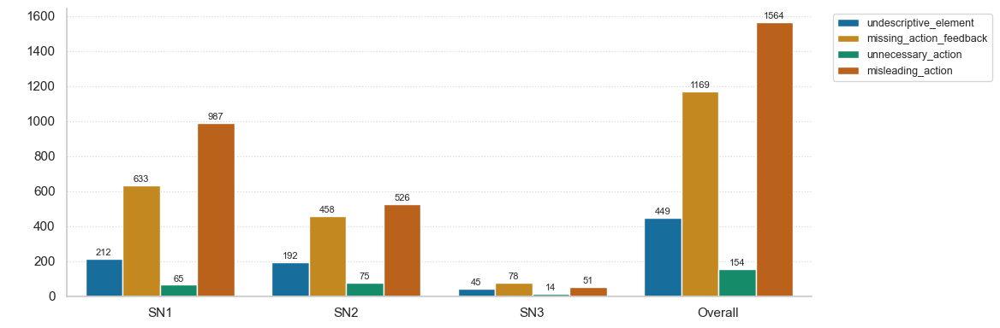

In [40]:
plot_smell_counts(action_level_df, action_level_smells, title='Count Distribution of Action-Level Smells per Network and Overall')
plt.savefig('new_plots/action_smells_distribution.pdf', bbox_inches='tight', dpi=300)

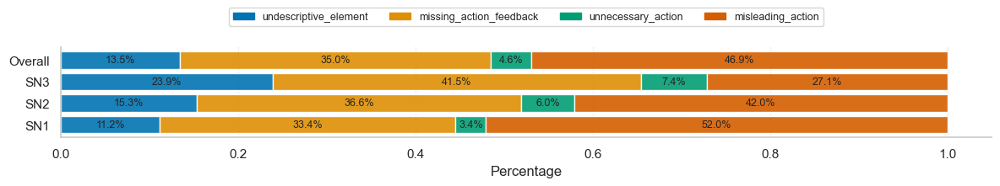

In [41]:
plot_smell_distribution(action_level_df, action_level_smells, 'Percentage Distribution of Action-Level Smells per Network and Overall')
plt.savefig('new_plots/action_smells_distribution_stacked.pdf', bbox_inches='tight', dpi=300)

- pairplot com algumas features numericas 

- Histogram (frequencia): Duracao no eixo x para cada smell (hue diferente)
- Heatmap -> smells vs smells -> quantas vezes smell i aparece junto com smell j (use labels_union)
- Proportion of usability smells com o srid no eixo x, ou task id no eixo x
- Scatter plot com task duration no eixo x, e usability smell no eixo y (ou seja: uma task com uma duracao de 10s (curta duracao) tem mais propensao a ter labels {x,y,z})
   - talvez quebrando duracoes em pedacos: curta duracao (< 10s), curta-media (10s - 30s), media (30s - 60s), media-longa (60s-120s), longa (>120s)
   - talvez precise normalizar a duracao para cada usuario
     
- para cada conjunto de smell (ou smell sozinho), contar quantas vezes ele aparece numa tarefa que foi concluida

- a relacao entre o numero de eventos de um tipo (click, change, tabchange, scroll) e o usability smell (ask chatgpt)
    - pensar em como normalizar o numero de eventos para cada usuario...

- 

In [42]:
c = df_all['labels_union'].apply(lambda x: str(list(set(str_to_list(x)) - set(['none'])))).value_counts()[1:].to_dict()
total = sum(list(c.values()))
for k, v in c.items():
    print('{:132s}: {:6d} ({:.2f})'.format(k, v, v/total))



# df_all['finished_task']

['misleading_action']                                                                                                               :    968 (0.17)
['missing_action_feedback']                                                                                                         :    717 (0.13)
['missing_task_feedback']                                                                                                           :    559 (0.10)
['laborious_task']                                                                                                                  :    246 (0.04)
['undescriptive_element']                                                                                                           :    230 (0.04)
['laborious_task', 'late_validation', 'missing_task_feedback']                                                                      :    205 (0.04)
['laborious_task', 'too_many_layers', 'high_interaction_distance']                                              

In [43]:
#df_filtered = df_all[df_all['username'] == 'L16']
# Filter rows where 'username' is 'L15' and 'task_id' is between 1 and 3 (inclusive)
df_filtered = df_all[(df_all['username'] == 'L01') & (df_all['task_id'].between(1, 2))]


# Show the 'task_id' and the annotated smells for these entries
df_filtered[['username','task_id', 'labels_union']]

,username,task_id,labels_union
11624,L01,1,"['repetition_in_text_fields', 'late_validation..."
11625,L01,1,"['unnecessary_action', 'none', 'missing_action..."
11626,L01,1,['none']
11627,L01,1,['none']
11628,L01,1,['none']
11629,L01,1,['none']
11630,L01,1,"['missing_action_feedback', 'none']"
11631,L01,1,"['missing_action_feedback', 'none']"
11632,L01,1,['none']
11633,L01,1,['none']


In [44]:
# Filter rows where 'username' is 'L01' and 'task_id' is between 1 and 2 (inclusive)
df_filtered = df_all[(df_all['username'] == 'L01') & (df_all['task_id'].between(1, 2))]

# Group by 'task_id' and combine 'labels_union' for each task_id
df_grouped = df_filtered.groupby('task_id').agg({
    'username': 'first',  # Since username is the same within each group, we can just take the first
    'labels_union': lambda x: ', '.join(set.union(*x.apply(lambda y: set(str_to_list(y)))))
}).reset_index()

# Show the 'task_id', 'username', and combined 'labels_union'
#print(df_grouped[['username', 'task_id', 'labels_union']])

for index, row in df_grouped.iterrows():
    print(f"Task ID: {row['task_id']}, Username: {row['username']}")
    
    # Separar os labels de 'labels_union' e imprimir cada um
    labels = row['labels_union'].split(', ')
    for label in labels:
        print(f"  Label: {label}")

Task ID: 1, Username: L01
  Label: too_many_layers
  Label: missing_action_feedback
  Label: none
  Label: repetition_in_text_fields
  Label: missing_task_feedback
  Label: unnecessary_action
  Label: late_validation
  Label: misleading_action
Task ID: 2, Username: L01
  Label: missing_action_feedback
  Label: none
  Label: unnecessary_action
  Label: repetition_in_text_fields
  Label: missing_task_feedback
  Label: misleading_action
  Label: late_validation


In [45]:
# Group by 'task_id' and 'username' and combine 'labels_union' for each task_id and username
df_grouped = df_all.groupby(['task_id']).agg({
    'username': 'first',  # Since username is the same within each group, we can just take the first
    'labels_union': lambda x: ', '.join(set.union(*x.apply(lambda y: set(str_to_list(y)))))
}).reset_index()

# Show the 'task_id', 'username', and combined 'labels_union'
for index, row in df_grouped.iterrows():
    print(f"Task ID: {row['task_id']}, Username: {row['username']}")
    
    # Separar os labels de 'labels_union' e imprimir cada um
    labels = row['labels_union'].split(', ')
    for label in labels:
        print(f"  Label: {label}")

Task ID: 0, Username: P01
  Label: none
Task ID: 1, Username: P01
  Label: cyclic_task
  Label: too_many_layers
  Label: undescriptive_element
  Label: laborious_task
  Label: missing_action_feedback
  Label: high_interaction_distance
  Label: none
  Label: unnecessary_action
  Label: repetition_in_text_fields
  Label: missing_task_feedback
  Label: misleading_action
  Label: late_validation
Task ID: 2, Username: P01
  Label: too_many_layers
  Label: undescriptive_element
  Label: laborious_task
  Label: missing_action_feedback
  Label: high_interaction_distance
  Label: none
  Label: unnecessary_action
  Label: repetition_in_text_fields
  Label: missing_task_feedback
  Label: misleading_action
  Label: late_validation
Task ID: 3, Username: P01
  Label: cyclic_task
  Label: too_many_layers
  Label: undescriptive_element
  Label: laborious_task
  Label: missing_action_feedback
  Label: high_interaction_distance
  Label: none
  Label: missing_task_feedback
  Label: unnecessary_action
  L

## Heatmap

In [46]:
def prepare_smell_pair_counts(df, smells, level='task'):

    smells_pairs = [f'{smell}_{smell2}' for smell in smells for smell2 in smells]
    smell_counts = {s: [] for s in smells_pairs}
    smell_counts['total_count'] = None
    smell_counts['network'] = []
    set_valid_smells = set(smells)
    
    networks = df['network'].unique()
    
    for network in networks:
        df_network = df[df['network'] == network]

        ann_smell_count = {f'{smell}_{smell2}': 0 for smell in smells for smell2 in smells}

        # use labels_union?
        for username, valid_cols in valid_cols_per_network[network].items():
            df_user = df_network[df_network['username'] == username]

            if level == 'task':
                for task_id in range(18):
                    df_user_task = df_user[(df_user['task_id'] == task_id)]
                    if len(df_user_task) == 0:
                        continue
                    row_task = df_user_task.iloc[0]
                    for valid_col in valid_cols:
                        label_id = 'labels_{}'.format(valid_col)
                        ann_smells = str_to_list(row_task[label_id])
                        for smell in smells:
                            for smell2 in smells:
                                ann_smell_count[f'{smell}_{smell2}'] += int(smell in ann_smells and smell2 in ann_smells)
            else:
                for valid_col in valid_cols:
                    label_id = 'labels_{}'.format(valid_col)
                    for smell in smells:
                        for smell2 in smells:
                            ann_smell_count[f'{smell}_{smell2}'] += df_user[label_id].apply(lambda x: 1 if (smell in str_to_list(x) and smell2 in str_to_list(x)) else 0).sum()
            
        for smell in smells:
            for smell2 in smells:
                smell_counts[f'{smell}_{smell2}'].append(ann_smell_count[f'{smell}_{smell2}'])
        smell_counts['network'].append(network)
    

    new_df = pd.DataFrame(smell_counts)
    new_df['total_count'] = new_df[smells_pairs].sum(1)

    # add a new network named 'Overall' with the sum of all others
    sum_row = new_df.drop(columns=['network']).sum(0)    
    sum_row['network'] = 'Overall'
    sum_df = pd.DataFrame(sum_row).T
    new_df = pd.concat([new_df, sum_df], ignore_index=True)

    return new_df
        


task_level_pair_df  = prepare_smell_pair_counts(df_all, task_level_smells, level='task')
task_level_pair_df

action_level_pair_df  = prepare_smell_pair_counts(df_all, action_level_smells, level='action')
action_level_pair_df

,undescriptive_element_undescriptive_element,undescriptive_element_missing_action_feedback,undescriptive_element_unnecessary_action,undescriptive_element_misleading_action,missing_action_feedback_undescriptive_element,missing_action_feedback_missing_action_feedback,missing_action_feedback_unnecessary_action,missing_action_feedback_misleading_action,unnecessary_action_undescriptive_element,unnecessary_action_missing_action_feedback,unnecessary_action_unnecessary_action,unnecessary_action_misleading_action,misleading_action_undescriptive_element,misleading_action_missing_action_feedback,misleading_action_unnecessary_action,misleading_action_misleading_action,total_count,network
0,212,9,2,68,9,633,3,21,2,3,65,4,68,21,4,987,2111,SN_1
1,192,16,5,27,16,458,2,25,5,2,75,0,27,25,0,526,1401,SN_2
2,45,6,2,6,6,78,1,5,2,1,14,1,6,5,1,51,230,SN_3
3,449,31,9,101,31,1169,6,51,9,6,154,5,101,51,5,1564,3742,Overall


In [47]:
df_all.columns[:20]

Index(['network', 'username', 'pid', 'eid', 'rid', 'srid', 'event', 'task_id',
       'unix_time', 'time', 'url', 'dom_object', 'xpath', 'labels_0',
       'labels_1', 'labels_2', 'labels_union', 'labels_inter', 'labels_valid',
       'finished_task'],
      dtype='object')

In [48]:
network = 'Overall'
consider_first_diag = False

# Separate co-occurrence matrices for task and action smells
co_occurrence_task = pd.DataFrame(0, index=task_level_smells, columns=task_level_smells)
co_occurrence_action = pd.DataFrame(0, index=action_level_smells, columns=action_level_smells)

# Separate co-occurrence matrices for task and action smells
co_occurrence_task = pd.DataFrame(0, index=task_level_smells, columns=task_level_smells)
co_occurrence_action = pd.DataFrame(0, index=action_level_smells, columns=action_level_smells)

tmp_df = task_level_pair_df[task_level_pair_df['network'] == network]
for smell in task_level_smells:
    for smell2 in task_level_smells:
        if not consider_first_diag and (smell == smell2):
            continue
        co_occurrence_task.loc[smell, smell2] = tmp_df[f'{smell}_{smell2}'].iloc[0]

tmp_df = action_level_pair_df[action_level_pair_df['network'] == network]
for smell in action_level_smells:
    for smell2 in action_level_smells:
        if not consider_first_diag and (smell == smell2):
            continue
        co_occurrence_action.loc[smell, smell2] = tmp_df[f'{smell}_{smell2}'].iloc[0]

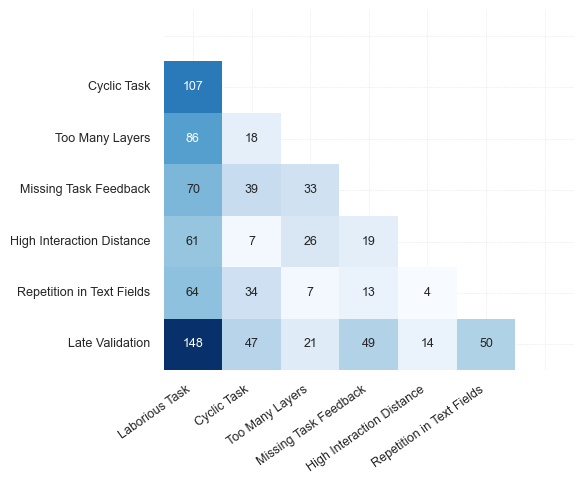

In [49]:
# Define your list of smells
my_smells_task = [
    'Laborious Task', 'Cyclic Task', 'Too Many Layers', 'Missing Task Feedback', 'High Interaction Distance', 'Repetition in Text Fields', 'Late Validation'
]  

# Example labels, replace with your actual list

# Create a mask for the upper triangle, including the diagonal
mask_task = np.triu(np.ones_like(co_occurrence_task, dtype=bool))  # Mask for task-level smells
mask_action = np.triu(np.ones_like(co_occurrence_action, dtype=bool))      # Mask for action-level smells

# Set up the figure with subplots side by side
fig, ax1 = plt.subplots(1, 1, figsize=(6, 5))

# Generate the heatmap for task-level smells
sns.heatmap(co_occurrence_task, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 9}, cbar=False, ax=ax1, mask=mask_task)

# ax1.set_xticklabels(ax1.get_xticklabels(), rotation=35, ha='right')

# Set custom x and y tick labels
ax1.set_xticklabels(my_smells_task[:-1] + [''], rotation=35, ha='right', fontsize=9)  # Adjust fontsize of x labels
ax1.set_yticklabels([''] + my_smells_task[1:], rotation=0, ha='right', fontsize=9)  # Adjust fontsize of y labels


ax1.grid(lw=0.45, linestyle=":", which='major')

# Adjust layout to ensure square-like cells and tight layout
plt.tight_layout()

plt.savefig('new_plots/task_level_pair_counts.pdf', bbox_inches='tight', dpi=300)

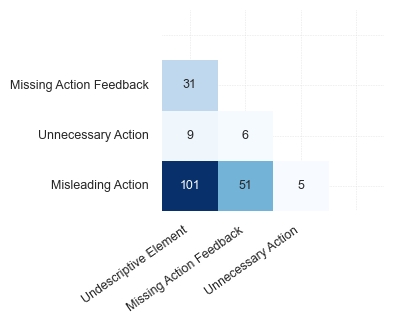

In [50]:
my_smells_action = [
    'Undescriptive Element', 'Missing Action Feedback', 'Unnecessary Action', 'Misleading Action'
]  


# Set up the figure with subplots side by side
fig, ax2 = plt.subplots(1, 1, figsize=(4.1, 3.4))

# Generate the heatmap for action-level smells
sns.heatmap(co_occurrence_action, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 9}, cbar=False, ax=ax2, mask=mask_action)

# Set custom x and y tick labels
ax2.set_xticklabels(my_smells_action[:-1] + [''], rotation=35, ha='right', fontsize=9)  # Adjust fontsize of x labels
ax2.set_yticklabels([''] + my_smells_action[1:], rotation=0, ha='right', fontsize=9)  # Adjust fontsize of y labels

ax2.grid(lw=0.45, linestyle=":", which='major')

# Adjust layout to ensure square-like cells and tight layout
plt.tight_layout()

plt.savefig('new_plots/action_level_pair_counts.pdf', bbox_inches='tight', dpi=300)

In [51]:
df_tmp = df_all[
    [
        'eid', 'labels_union', 'event_duration', 'episode_total_duration', 'task_id', 'network', 'username',
        'episode_click_num','episode_scroll_num','episode_change_num','episode_keypress_num', 'event'
    ]
].copy()


# episodes only
df_tmp = df_tmp[df_tmp['eid'] == 0]
df_tmp = df_tmp[df_tmp['labels_union'].apply(lambda x: 'descriptive_element' not in x and 'none' not in x)]
df_tmp = df_tmp[df_tmp['event_duration'] > 0]
df_tmp = df_tmp[df_tmp['episode_total_duration'] > 0]

df_tmp = df_tmp.groupby(['network', 'username', 'task_id']).agg({
    'episode_total_duration': 'sum',    # Sum the durations
    'labels_union': 'first'             # Take the first 'labels_union' (since they should be the same)
}).reset_index()

# Create a new dataframe where each smell is exploded into individual rows
df_tmp['smells'] = df_tmp['labels_union'].apply(str_to_list)  # Convert the string to a list
df_exploded = df_tmp.explode('smells')  # Explode the lists so each smell has its own row


# Convert the 'smells' column to a categorical type with the specified order
df_exploded['smells'] = pd.Categorical(df_exploded['smells'], categories=task_level_smells, ordered=True)

# Sort the dataframe by the order of 'smells'
df_exploded = df_exploded.sort_values('smells')

# # Group by each smell and calculate the mean and standard deviation of event duration
duration_stats = df_exploded.groupby('smells')['episode_total_duration'].agg(['mean', 'std']).reset_index()


/tmp/ipykernel_15012/349094834.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  duration_stats = df_exploded.groupby('smells')['episode_total_duration'].agg(['mean', 'std']).reset_index()


/tmp/ipykernel_15012/4205121306.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(my_smells_task, rotation=35, ha='right', fontsize=9.5)


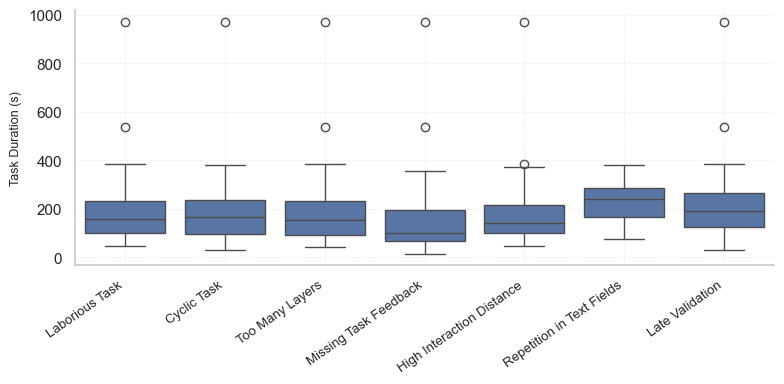

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))

# Create a box plot for task duration grouped by smell
sns.despine()
sns.boxplot(x='smells', y='episode_total_duration', data=df_exploded, order=task_level_smells, ax=ax)

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('Task Duration (s)', fontsize=9)

# Rotate x-axis labels for readability
ax.set_xticklabels(my_smells_task, rotation=35, ha='right', fontsize=9.5)

ax.grid(lw=0.45, linestyle=":", which='major')

plt.tight_layout()

plt.savefig('new_plots/smell_x_task_duration.pdf', bbox_inches='tight', dpi=300)

/home/mtreviso/Work/extract-logs/env/lib/python3.10/site-packages/seaborn/categorical.py:3398: UserWarning: 17.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mtreviso/Work/extract-logs/env/lib/python3.10/site-packages/seaborn/categorical.py:3398: UserWarning: 14.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/tmp/ipykernel_15012/1788489217.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(my_smells_task, rotation=35, ha='right', fontsize=9)
/home/mtreviso/Work/extract-logs/env/lib/python3.10/site-packages/seaborn/categorical.py:3398: UserWarning: 16.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mtreviso/Wor

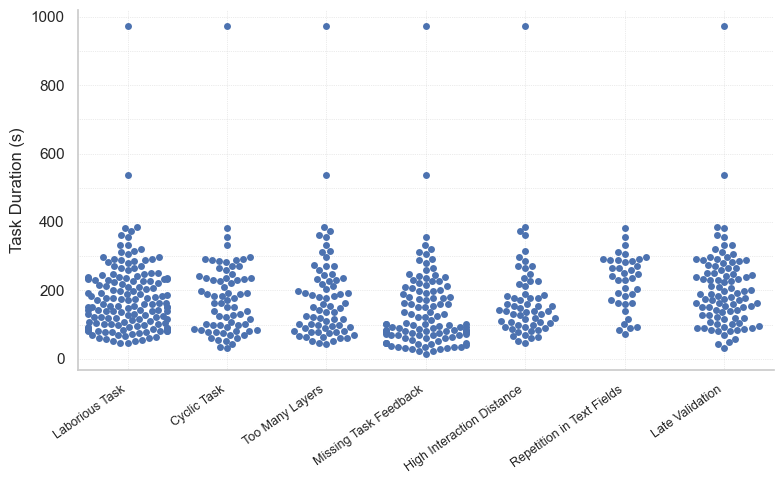

In [53]:
from matplotlib.ticker import MultipleLocator

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

# Create a swarm plot to visualize task duration for each smell
sns.despine()
sns.swarmplot(x='smells', y='episode_total_duration', data=df_exploded, order=task_level_smells, size=5, ax=ax)

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('Task Duration (s)')

# Rotate x-axis labels for readability
ax.set_xticklabels(my_smells_task, rotation=35, ha='right', fontsize=9)

# Optionally, customize the minor tick frequency if needed
ax.minorticks_on()  # Enable minor ticks

# Major grid lines at intervals of 200 on y-axis
ax.yaxis.set_major_locator(MultipleLocator(200))

# Minor grid lines at intervals of 100 on y-axis
ax.yaxis.set_minor_locator(MultipleLocator(100))

#ax.xaxis.set_minor_locator(AutoMinorLocator(0.25))  # Adjust the number of minor ticks between major ticks

# Customizar grade maior e menor
ax.grid(lw=0.5, linestyle=":", which='minor', axis='y')  # Grid lines for both major and minor ticks
ax.grid(lw=0.5, linestyle=":", which='major')

# ax.yaxis.set_minor_locator(AutoMinorLocator(1))  # Adjust for y-axis too

plt.tight_layout()

plt.savefig('new_plots/smell_x_task_duration_2.pdf', bbox_inches='tight', dpi=300)

### Overlaying Swarm Plot on Box Plot

https://www.geeksforgeeks.org/overlaying-box-plot-on-swarm-plot-in-seaborn/

/home/mtreviso/Work/extract-logs/env/lib/python3.10/site-packages/seaborn/categorical.py:3398: UserWarning: 22.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mtreviso/Work/extract-logs/env/lib/python3.10/site-packages/seaborn/categorical.py:3398: UserWarning: 19.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/tmp/ipykernel_15012/1591873104.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(my_smells_task, rotation=35, ha='right', fontsize=9.5)
/home/mtreviso/Work/extract-logs/env/lib/python3.10/site-packages/seaborn/categorical.py:3398: UserWarning: 17.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/mtreviso/W

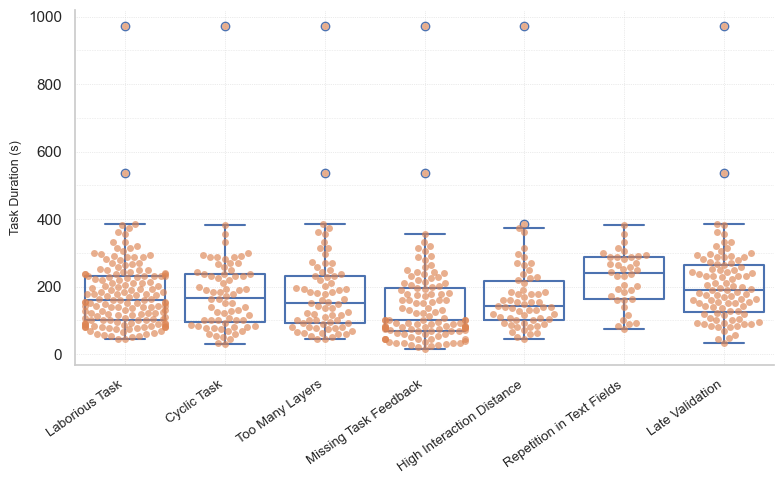

In [54]:
from matplotlib.ticker import MultipleLocator

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

# Create a box plot for task duration grouped by smell
sns.despine()
sns.boxplot(x='smells', y='episode_total_duration', data=df_exploded, order=task_level_smells, ax=ax, zorder=1, fill=0) #color="0.99"
sns.swarmplot(x='smells', y='episode_total_duration', data=df_exploded, order=task_level_smells, size=5, ax=ax, zorder=2, alpha=0.65)
#color=".2",

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('Task Duration (s)', fontsize=9)

# Rotate x-axis labels for readability
ax.set_xticklabels(my_smells_task, rotation=35, ha='right', fontsize=9.5)

# Adjust y-axis ticks to add one more grid line between major lines
ax.yaxis.set_major_locator(MultipleLocator(200))  # Set major ticks at intervals of 200
ax.yaxis.set_minor_locator(MultipleLocator(100))  # Set minor ticks at intervals of 100

ax.grid(lw=0.5, linestyle=":", which='major')
ax.grid(lw=0.45, linestyle=":", which='minor', axis='y')

plt.tight_layout()

plt.savefig('new_plots/smell_x_task_duration_box_swarm.pdf', bbox_inches='tight', dpi=300)


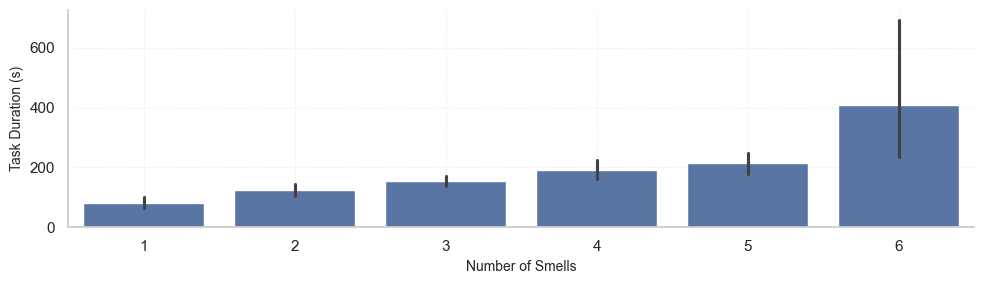

In [55]:
# Create a new column representing the number of smells for each task
df_tmp['smell_count'] = df_tmp['labels_union'].apply(lambda x: len(str_to_list(x)))

fig, ax = plt.subplots(1, 1, figsize=(10, 3))

# Create a scatter plot of task duration vs. the number of smells
sns.despine()
sns.barplot(x='smell_count', y='episode_total_duration', data=df_tmp, ax=ax)

# Add labels and title
ax.set_xlabel('Number of Smells', fontsize=10)
ax.set_ylabel('Task Duration (s)', fontsize=10)

ax.grid(lw=0.45, linestyle=":", which='major')

plt.tight_layout()

plt.savefig('new_plots/num_smell_x_task_duration.pdf', bbox_inches='tight', dpi=300)



In [56]:
my_smells_task

['Laborious Task',
 'Cyclic Task',
 'Too Many Layers',
 'Missing Task Feedback',
 'High Interaction Distance',
 'Repetition in Text Fields',
 'Late Validation']

In [57]:
my_smells_task_d = {
    'laborious_task': 'Laborious Task',
    'cyclic_task': 'Cyclic Task',
    'too_many_layers': 'Too Many Layers',
    'missing_task_feedback': 'Missing Task Feedback',
    'high_interaction_distance': 'High Interaction Distance',
    'repetition_in_text_fields': 'Repetition in Text Fields',
    'late_validation': 'Late Validation'
}

In [58]:
my_smells_task_d['laborious_task']

'Laborious Task'

/tmp/ipykernel_15012/1338043398.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([my_smells_task_d[l.get_text()] for l in ax.get_xticklabels()], rotation=35, ha='right')


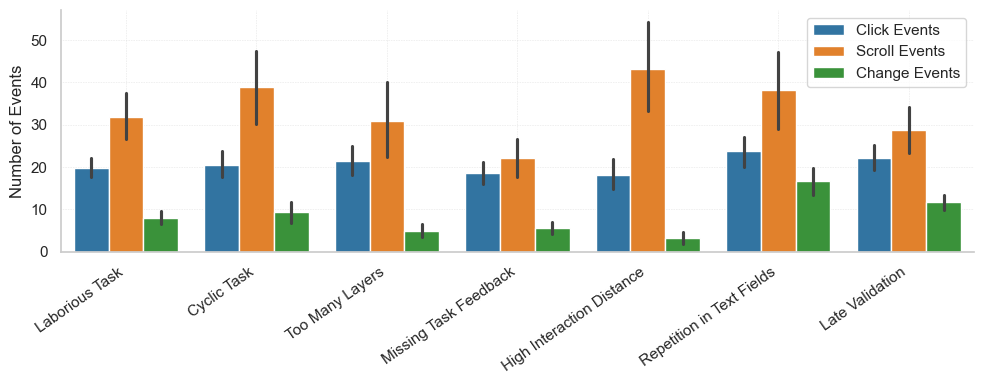

In [59]:
df_tmp = df_all[
    [
        'eid', 'labels_union', 'event_duration', 'episode_total_duration', 'task_id', 'network', 'username',
        'episode_click_num', 'episode_scroll_num', 'episode_change_num', 'episode_keypress_num', 'event',
        'episode_click_duration', 'episode_scroll_duration', 'episode_change_duration',
    ]
].copy()

# Filter for episodes only
df_tmp = df_tmp[df_tmp['eid'] == 0]
df_tmp = df_tmp[df_tmp['labels_union'].apply(lambda x: 'descriptive_element' not in x and 'none' not in x)]
df_tmp = df_tmp[df_tmp['event_duration'] > 0]
df_tmp = df_tmp[df_tmp['episode_total_duration'] > 0]
df_tmp['smells'] = df_tmp['labels_union'].apply(str_to_list)  # Convert the string to a list
df_tmp = df_tmp.explode('smells')  # Explode the lists so each smell has its own row

# Group by smells and aggregate the durations for each event type
event_counts = df_tmp.groupby(['network', 'username', 'task_id', 'smells']).agg({
    'episode_click_num': 'sum',
    'episode_scroll_num': 'sum',
    'episode_change_num': 'sum',
    # 'episode_keypress_num': 'sum',
    'labels_union': 'first'             # Take the first 'labels_union' (since they should be the same)
}).reset_index()




# Melt the dataframe to plot it in seaborn, explicitly cast the event names as strings
event_counts_melted = event_counts.melt(id_vars='smells', 
                                        value_vars=['episode_click_num', 'episode_scroll_num', 'episode_change_num'],
                                        var_name='event', value_name='event_count')

# Ensure the 'event' column is treated as a string
event_counts_melted['event'] = event_counts_melted['event'].astype(str)


# Ensure the 'smells' column is treated as a categorical variable with a specific order
event_counts_melted['smells'] = pd.Categorical(event_counts_melted['smells'], categories=task_level_smells, ordered=True)


fig, ax = plt.subplots(1, 1, figsize=(10, 4))

# Bar plot for event counts per usability smell
sns.despine()
sns.barplot(x='smells', y='event_count', hue='event', data=event_counts_melted, palette='tab10', ax=ax)

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('Number of Events')
# plt.title('Event Duration for Each Usability Smell')

# Update the legend labels
event_legend_map = {'episode_click_num': 'Click Events', 
                    'episode_scroll_num': 'Scroll Events', 
                    'episode_change_num': 'Change Events', 
                    'episode_keypress_num': 'Keypress Events'}

handles, labels = ax.get_legend_handles_labels()  # Get current legend handles and labels
new_labels = [event_legend_map[label] for label in labels]  # Map the labels using your dictionary
ax.legend(handles, new_labels, title=None)  # Set the new legend with updated labels


ax.set_xticklabels([my_smells_task_d[l.get_text()] for l in ax.get_xticklabels()], rotation=35, ha='right')

ax.grid(lw=0.45, linestyle=":", which='major')

plt.tight_layout()

plt.savefig('new_plots/smell_x_event_num_without_keypress.pdf', bbox_inches='tight', dpi=300)


/tmp/ipykernel_15012/2304962071.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([my_smells_task_d[l.get_text()] for l in ax.get_xticklabels()], rotation=35, ha='right')


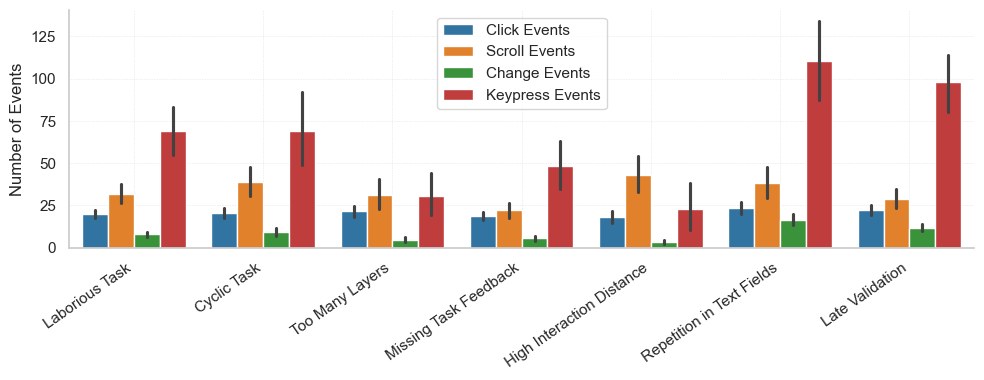

In [60]:
df_tmp = df_all[
    [
        'eid', 'labels_union', 'event_duration', 'episode_total_duration', 'task_id', 'network', 'username',
        'episode_click_num', 'episode_scroll_num', 'episode_change_num', 'episode_keypress_num', 'event',
        'episode_click_duration', 'episode_scroll_duration', 'episode_change_duration',
    ]
].copy()

# Filter for episodes only
df_tmp = df_tmp[df_tmp['eid'] == 0]
df_tmp = df_tmp[df_tmp['labels_union'].apply(lambda x: 'descriptive_element' not in x and 'none' not in x)]
df_tmp = df_tmp[df_tmp['event_duration'] > 0]
df_tmp = df_tmp[df_tmp['episode_total_duration'] > 0]
df_tmp['smells'] = df_tmp['labels_union'].apply(str_to_list)  # Convert the string to a list
df_tmp = df_tmp.explode('smells')  # Explode the lists so each smell has its own row

# Group by smells and aggregate the durations for each event type
event_counts = df_tmp.groupby(['network', 'username', 'task_id', 'smells']).agg({
    'episode_click_num': 'sum',
    'episode_scroll_num': 'sum',
    'episode_change_num': 'sum',
    'episode_keypress_num': 'sum',
    'labels_union': 'first'             # Take the first 'labels_union' (since they should be the same)
}).reset_index()




# Melt the dataframe to plot it in seaborn, explicitly cast the event names as strings
event_counts_melted = event_counts.melt(id_vars='smells', 
                                        value_vars=['episode_click_num', 'episode_scroll_num', 'episode_change_num', 'episode_keypress_num'],
                                        var_name='event', value_name='event_count')

# Ensure the 'event' column is treated as a string
event_counts_melted['event'] = event_counts_melted['event'].astype(str)


# Ensure the 'smells' column is treated as a categorical variable with a specific order
event_counts_melted['smells'] = pd.Categorical(event_counts_melted['smells'], categories=task_level_smells, ordered=True)


fig, ax = plt.subplots(1, 1, figsize=(10, 4))

# Bar plot for event counts per usability smell
sns.despine()
sns.barplot(x='smells', y='event_count', hue='event', data=event_counts_melted, palette='tab10', ax=ax)

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('Number of Events')
# plt.title('Event Duration for Each Usability Smell')

# Update the legend labels
event_legend_map = {'episode_click_num': 'Click Events', 
                    'episode_scroll_num': 'Scroll Events', 
                    'episode_change_num': 'Change Events', 
                    'episode_keypress_num': 'Keypress Events'}

handles, labels = ax.get_legend_handles_labels()  # Get current legend handles and labels
new_labels = [event_legend_map[label] for label in labels]  # Map the labels using your dictionary
ax.legend(handles, new_labels, title=None)  # Set the new legend with updated labels


ax.set_xticklabels([my_smells_task_d[l.get_text()] for l in ax.get_xticklabels()], rotation=35, ha='right')

ax.grid(lw=0.45, linestyle=":", which='major')

plt.tight_layout()

plt.savefig('new_plots/smell_x_event_num_with_keypress.pdf', bbox_inches='tight', dpi=300)


/tmp/ipykernel_15012/3603400610.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([my_smells_task_d[l.get_text()] for l in ax.get_xticklabels()], rotation=35, ha='right')


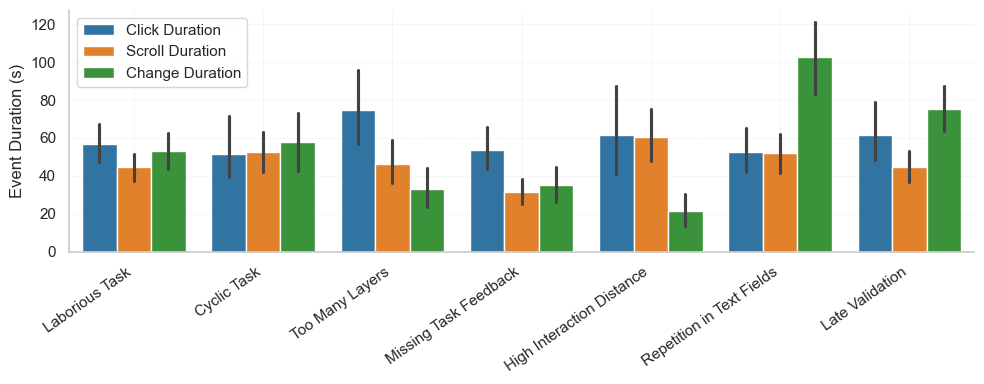

In [61]:
df_tmp = df_all[
    [
        'eid', 'labels_union', 'event_duration', 'episode_total_duration', 'task_id', 'network', 'username',
        'episode_click_num', 'episode_scroll_num', 'episode_change_num', 'episode_keypress_num', 'event',
        'episode_click_duration', 'episode_scroll_duration', 'episode_change_duration',
    ]
].copy()

# Filter for episodes only
df_tmp = df_tmp[df_tmp['eid'] == 0]
df_tmp = df_tmp[df_tmp['labels_union'].apply(lambda x: 'descriptive_element' not in x and 'none' not in x)]
df_tmp = df_tmp[df_tmp['event_duration'] > 0]
df_tmp = df_tmp[df_tmp['episode_total_duration'] > 0]
df_tmp['smells'] = df_tmp['labels_union'].apply(str_to_list)  # Convert the string to a list
df_tmp = df_tmp.explode('smells')  # Explode the lists so each smell has its own row

# Group by smells and aggregate the durations for each event type
event_counts = df_tmp.groupby(['network', 'username', 'task_id', 'smells']).agg({
    'episode_click_duration': 'sum',
    'episode_scroll_duration': 'sum',
    'episode_change_duration': 'sum',
    
    'labels_union': 'first'             # Take the first 'labels_union' (since they should be the same)
}).reset_index()

# Melt the dataframe to plot it in seaborn, explicitly cast the event names as strings
event_counts_melted = event_counts.melt(id_vars='smells', 
                                        value_vars=['episode_click_duration', 'episode_scroll_duration', 'episode_change_duration'],
                                        var_name='event', value_name='event_count')

# Ensure the 'event' column is treated as a string
event_counts_melted['event'] = event_counts_melted['event'].astype(str)

# Ensure the 'smells' column is treated as a categorical variable with a specific order
event_counts_melted['smells'] = pd.Categorical(event_counts_melted['smells'], categories=task_level_smells, ordered=True)


fig, ax = plt.subplots(1, 1, figsize=(10, 4))

# Bar plot for event counts per usability smell
sns.despine()
sns.barplot(x='smells', y='event_count', hue='event', data=event_counts_melted, palette='tab10')

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('Event Duration (s)')
# plt.title('Event Duration for Each Usability Smell')

# Update the legend labels
event_legend_map = {'episode_click_duration': 'Click Duration', 
                    'episode_scroll_duration': 'Scroll Duration', 
                    'episode_change_duration': 'Change Duration', 
                    }

handles, labels = ax.get_legend_handles_labels()  # Get current legend handles and labels
new_labels = [event_legend_map[label] for label in labels]  # Map the labels using your dictionary
ax.legend(handles, new_labels, title=None)  # Set the new legend with updated labels

# Rotate x-axis labels for readability
ax.set_xticklabels([my_smells_task_d[l.get_text()] for l in ax.get_xticklabels()], rotation=35, ha='right')

ax.grid(lw=0.45, linestyle=":", which='major')

plt.tight_layout()

plt.savefig('new_plots/smell_x_event_duration_2.pdf', bbox_inches='tight', dpi=300)

# Exploring Emotions

1) Emotions from Face
3) Emotions from EEG
4) Emotions from BVP
5) Emotions from SAM

In [62]:
df_tmp = df_all[(df_all['network'] == 'SN_1') & (df_all['username'] == 'P10')]
df_tmp[[
    'pid', 'eid', 'rid', 'srid',  
    'episode_total_duration', 'episode_total_events', 'event_duration', 
    'episode_bit_eeg_signal_avg', 'event_bit_eeg_signal_avg', 
    'labels_union', 'labels_inter'
]]

,pid,eid,rid,srid,episode_total_duration,episode_total_events,event_duration,episode_bit_eeg_signal_avg,event_bit_eeg_signal_avg,labels_union,labels_inter
2467,0,0,0.000000,0.000000,68.586,2,0.000,0.500552,0.500552,['none'],['none']
2468,0,1,1.000000,0.002212,68.586,2,68.586,0.500529,0.500529,['none'],['none']
2469,1,0,0.000000,0.004425,180.606,48,1.331,0.500923,0.521247,"['repetition_in_text_fields', 'laborious_task'...",[]
2470,1,1,0.021277,0.006637,180.606,48,2.328,0.498468,0.498468,['none'],['none']
2471,1,2,0.042553,0.008850,180.606,48,10.759,0.502742,0.503667,['none'],['none']
...,...,...,...,...,...,...,...,...,...,...,...
2915,73,2,1.000000,0.991150,8.585,3,3.212,0.502842,0.507684,['none'],['none']
2916,74,0,0.000000,0.993363,14.204,4,0.540,0.502605,0.507684,"['none', 'laborious_task']",[]
2917,74,1,0.333333,0.995575,14.204,4,10.847,0.497692,0.497692,['none'],['none']
2918,74,2,0.666667,0.997788,14.204,4,1.568,0.498876,0.507063,"['undescriptive_element', 'none']",[]


## EEG

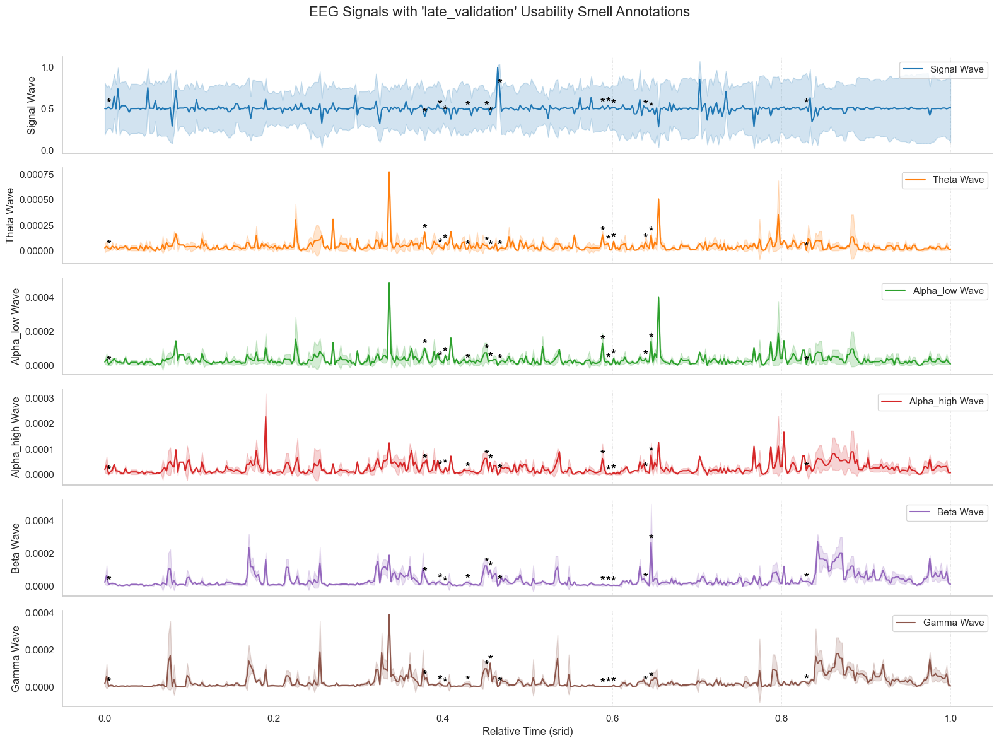

In [63]:
# Function to plot EEG waves and annotate smells, now with std shading
def plot_eeg_with_smells(df, waves, smell_to_study='late_validation', colors=None):
    fig, axes = plt.subplots(nrows=len(waves), ncols=1, figsize=(16, 12), sharex=True)
    
    # Ensure we get a list of axes, even if there's only one subplot
    if len(waves) == 1:
        axes = [axes]
    
    # Default colors if none provided
    if not colors:
        colors = sns.color_palette("husl", len(waves))
    
    for i, wave in enumerate(waves):
        ax = axes[i]
        wave_col = colors[i]

        # Plot the EEG signal for the current wave
        sns.lineplot(x=df['srid'], y=df[f'event_bit_eeg_{wave}_avg'], ax=ax, color=wave_col, label=f"{wave.capitalize()} Wave")
        
        # Plot shaded region for standard deviation
        if f'event_bit_eeg_{wave}_std' in df.columns:
            ax.fill_between(df['srid'], 
                            df[f'event_bit_eeg_{wave}_avg'] - df[f'event_bit_eeg_{wave}_std'],
                            df[f'event_bit_eeg_{wave}_avg'] + df[f'event_bit_eeg_{wave}_std'],
                            color=wave_col, alpha=0.2)

        prev_srids = set()
        
        # Adding usability smell annotations as markers on the plot
        for idx, row in df.iterrows():
            if row['labels_union']:
                for label in row['labels_union']:

                    if smell_to_study == 'all':
                        if 'none' in label or row['srid'] in prev_srids:
                            continue
                            
                        prev_srids.add(row['srid'])

                    else:
                        if 'none' in label or smell_to_study not in label:
                            continue

                    ax.annotate(
                        '*',
                        (row['srid'], row[f'event_bit_eeg_{wave}_avg']),  # Place the marker at the correct point
                        textcoords="offset points",
                        xytext=(0, 0),  # Offset to avoid overlap
                        ha='center',
                        color='black',
                        fontsize=14,
                        fontweight='bold'
                    )
        
        # Set axis labels and title for each subplot
        ax.set_ylabel(f"{wave.capitalize()} Wave")
        ax.legend(loc="upper right")
    
    # Set a common xlabel and title for the entire figure
    axes[-1].set_xlabel("Relative Time (srid)")
    fig.suptitle(f"EEG Signals with '{smell_to_study}' Usability Smell Annotations", fontsize=16)
    
    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    plt.savefig(f'new_plots/eeg_{smell_to_study}.pdf', bbox_inches='tight', dpi=300)

# Example EEG waves to plot
eeg_waves = ['signal', 'theta', 'alpha_low', 'alpha_high', 'beta', 'gamma']

# Sample data filtering for specific user and network (already done in df_tmp)
df_tmp = df_all[(df_all['network'] == 'SN_1') & (df_all['username'] == 'P10')].copy()
df_tmp = df_tmp[[
    'pid', 'eid', 'rid', 'srid',  
    'episode_total_duration', 'episode_total_events', 'event_duration', 
    'episode_bit_eeg_signal_avg',
    'labels_union', 'labels_inter',
    'event_bit_eeg_signal_avg', 'event_bit_eeg_theta_avg', 'event_bit_eeg_alpha_low_avg',
    'event_bit_eeg_alpha_high_avg', 'event_bit_eeg_beta_avg', 'event_bit_eeg_gamma_avg',
    'event_bit_eeg_signal_std', 'event_bit_eeg_theta_std', 'event_bit_eeg_alpha_low_std',
    'event_bit_eeg_alpha_high_std', 'event_bit_eeg_beta_std', 'event_bit_eeg_gamma_std'
]]

# Convert labels_union from string representation of list to actual list
df_tmp['labels_union'] = df_tmp['labels_union'].apply(lambda x: str_to_list(x))

# Define colors for each wave plot
# custom_colors = ['#FF6347', '#4682B4', '#32CD32', '#FFD700', '#8A2BE2', '#FF1493']
# custom_colors = sns.color_palette("husl", len(eeg_waves))
custom_colors = sns.color_palette('tab10', len(eeg_waves))

# Call the plotting function
plot_eeg_with_smells(df_tmp, eeg_waves, smell_to_study='late_validation', colors=custom_colors)

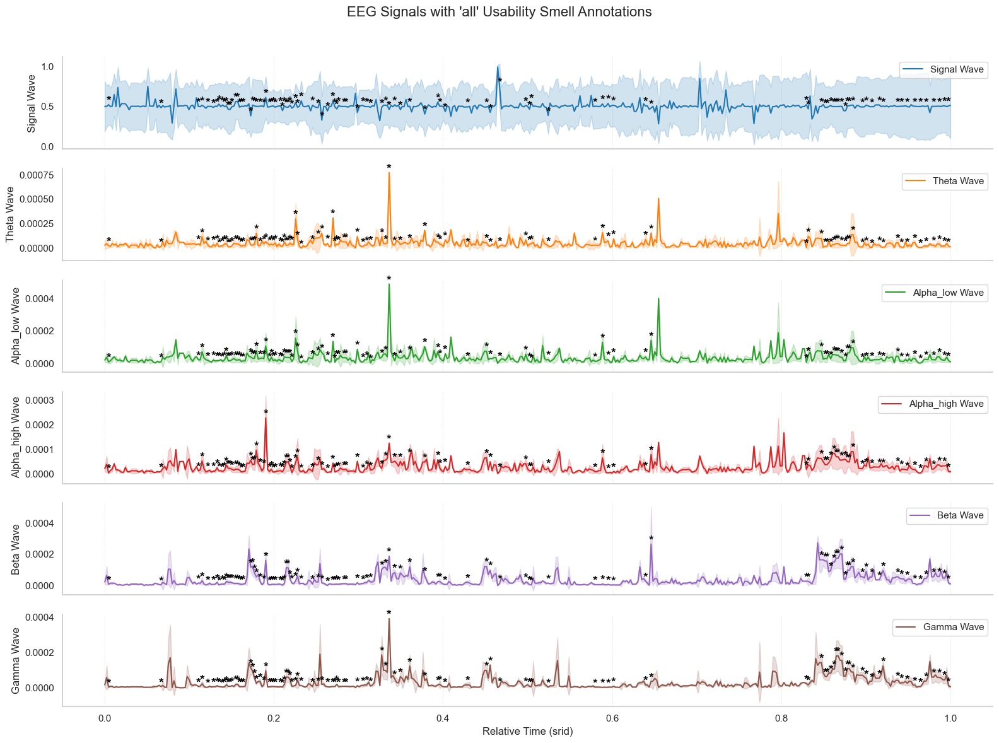

In [64]:
plot_eeg_with_smells(df_tmp, eeg_waves, smell_to_study='all', colors=custom_colors)

In [65]:
task_level_smells, action_level_smells

(['laborious_task',
  'cyclic_task',
  'too_many_layers',
  'missing_task_feedback',
  'high_interaction_distance',
  'repetition_in_text_fields',
  'late_validation'],
 ['undescriptive_element',
  'missing_action_feedback',
  'unnecessary_action',
  'misleading_action'])

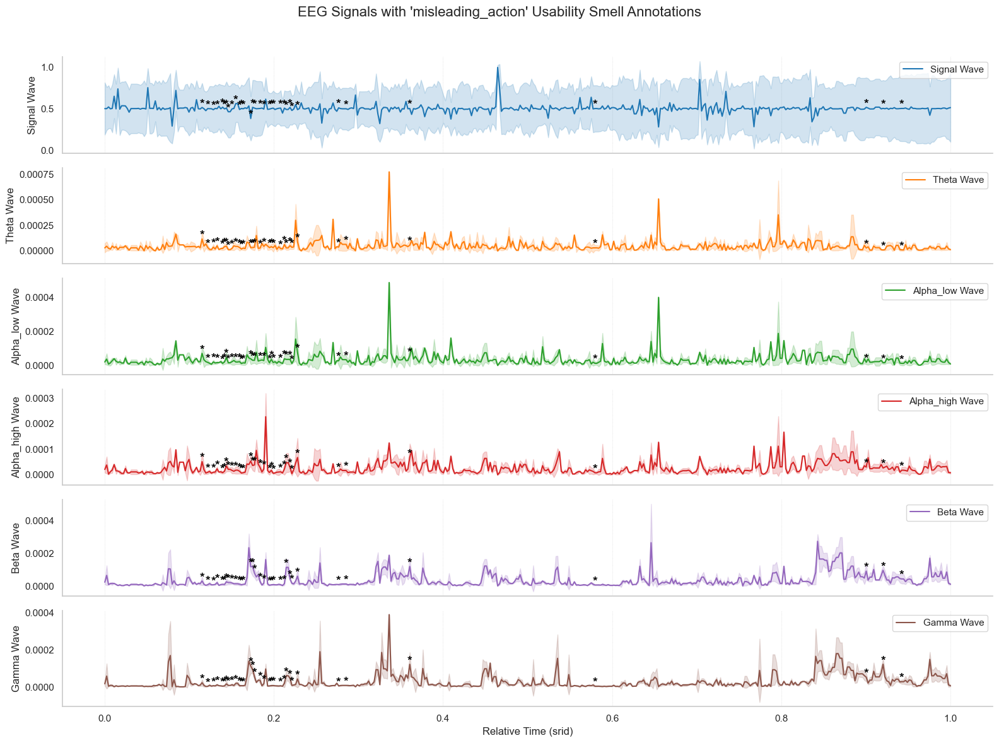

In [66]:
plot_eeg_with_smells(df_tmp, eeg_waves, smell_to_study='misleading_action', colors=custom_colors)

### with task delimiters

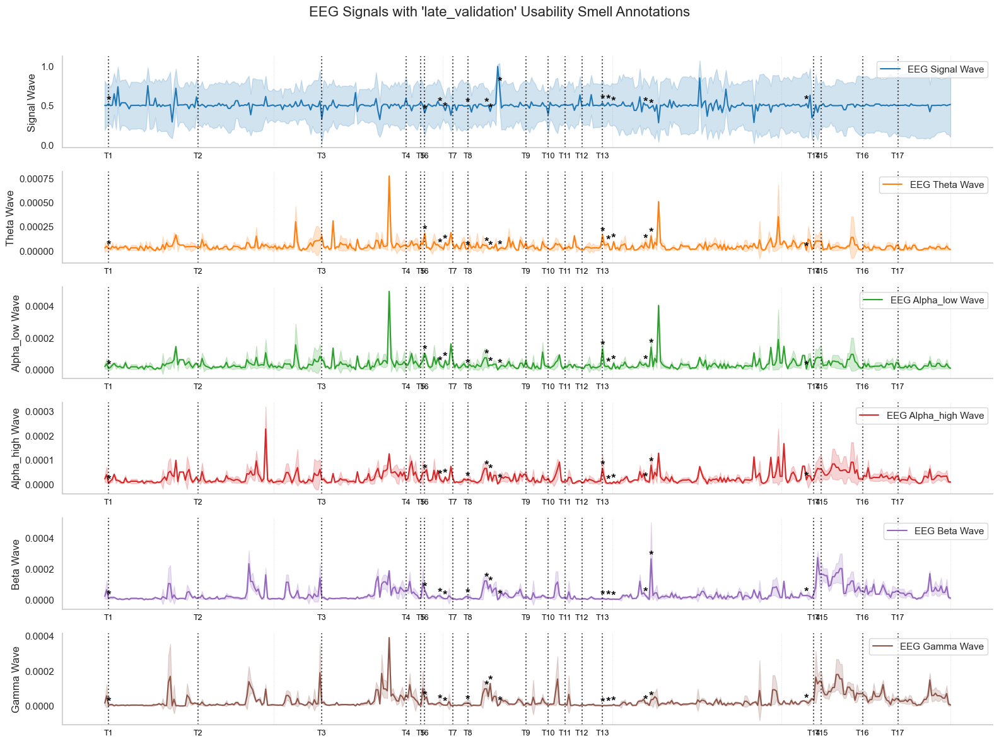

In [67]:
# Function to plot EEG waves and annotate smells, now with task_id changes marked
def plot_eeg_with_smells(df_tmp, waves, network='SN_1', username='P10', smell_to_study='late_validation', colors=None):
    fig, axes = plt.subplots(nrows=len(waves), ncols=1, figsize=(16, 12), sharex=True)

    # Sample data filtering for specific user and network (already done in df_tmp)
    df = df_tmp[(df_tmp['network'] == network) & (df_tmp['username'] == username)].copy()
    df = df[[
        'pid', 'eid', 'rid', 'srid',  
        'task_id',
        'episode_total_duration', 'episode_total_events', 'event_duration', 
        'episode_bit_eeg_signal_avg',  
        'labels_union', 'labels_inter',
        'event_bit_eeg_signal_avg', 'event_bit_eeg_theta_avg', 'event_bit_eeg_alpha_low_avg',
        'event_bit_eeg_alpha_high_avg', 'event_bit_eeg_beta_avg', 'event_bit_eeg_gamma_avg',
        'event_bit_eeg_signal_std', 'event_bit_eeg_theta_std', 'event_bit_eeg_alpha_low_std',
        'event_bit_eeg_alpha_high_std', 'event_bit_eeg_beta_std', 'event_bit_eeg_gamma_std'
    ]]
    
    # Convert labels_union from string representation of list to actual list
    df['labels_union'] = df['labels_union'].apply(lambda x: str_to_list(x))
    
    # Ensure we get a list of axes, even if there's only one subplot
    if len(waves) == 1:
        axes = [axes]
    
    # Default colors if none provided
    if not colors:
        colors = sns.color_palette("tab10", len(waves))
    
    # Identify the x positions where task_id changes
    task_change_indices = df['task_id'].ne(df['task_id'].shift()).cumsum()

    for i, wave in enumerate(waves):
        ax = axes[i]
        wave_col = colors[i]

        # Plot the EEG signal for the current wave
        sns.lineplot(x=df['srid'], y=df[f'event_bit_eeg_{wave}_avg'], ax=ax, color=wave_col, label=f"EEG {wave.capitalize()} Wave")
        
        # Plot shaded region for standard deviation
        if f'event_bit_eeg_{wave}_std' in df.columns:
            ax.fill_between(df['srid'], 
                            df[f'event_bit_eeg_{wave}_avg'] - df[f'event_bit_eeg_{wave}_std'],
                            df[f'event_bit_eeg_{wave}_avg'] + df[f'event_bit_eeg_{wave}_std'],
                            color=wave_col, alpha=0.2)

        prev_srids = set()
        
        # Adding usability smell annotations as markers on the plot
        for idx, row in df.iterrows():
            if row['labels_union']:
                for label in row['labels_union']:

                    if smell_to_study == 'all':
                        if 'none' in label or row['srid'] in prev_srids:
                            continue
                            
                        prev_srids.add(row['srid'])
                    
                    else:
                        if 'none' in label or smell_to_study not in label:
                            continue
                    
                    ax.annotate(
                        '*',
                        (row['srid'], row[f'event_bit_eeg_{wave}_avg']),  # Place the marker at the correct point
                        textcoords="offset points",
                        xytext=(0, 0),  # Offset to avoid overlap
                        ha='center',
                        color='black',
                        fontsize=14,
                        fontweight='bold'
                    )
        
        # Mark the task_id changes with vertical lines and xticks
        previous_task = None
        for j, row in df.iterrows():
            if row['task_id'] != previous_task:  # Check if task_id has changed
                if row['task_id'] == 0:
                    continue
                ax.axvline(x=row['srid'], color='black', linestyle=':', alpha=0.7)  # Add vertical line
                ax.text(row['srid'], ax.get_ylim()[0] - 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0]), 
                        f"T{row['task_id']}", color='black', fontsize=9, ha='center', va='top')  # Add task label
                previous_task = row['task_id']
        
        # Set axis labels and title for each subplot
        ax.set_ylabel(f"{wave.capitalize()} Wave")
        ax.set_xticklabels([])
        ax.legend(loc="upper right")
    
    # Set a common xlabel and title for the entire figure
    axes[-1].set_xlabel("")
    fig.suptitle(f"EEG Signals with '{smell_to_study}' Usability Smell Annotations", fontsize=16)
    
    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f'new_plots/eeg_task_{smell_to_study}.pdf', bbox_inches='tight', dpi=300)

# Example EEG waves to plot
eeg_waves = ['signal', 'theta', 'alpha_low', 'alpha_high', 'beta', 'gamma']

# Call the plotting function
plot_eeg_with_smells(df_all, eeg_waves, smell_to_study='late_validation', colors=custom_colors)

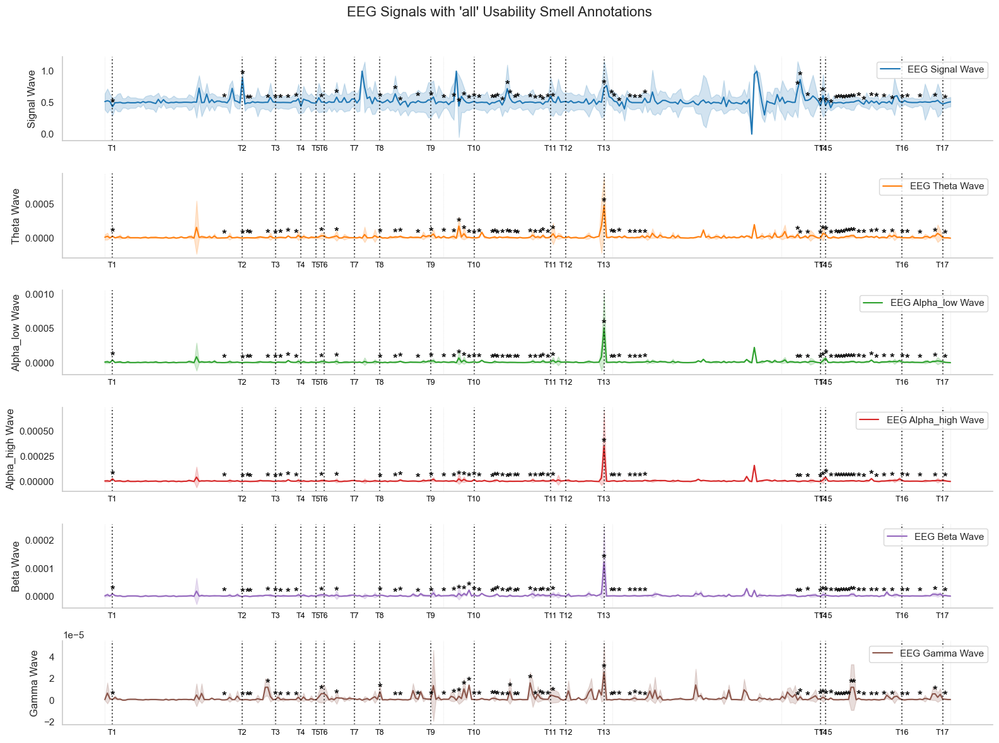

In [68]:
plot_eeg_with_smells(df_all, eeg_waves, network='SN_1', username='P30', smell_to_study='all')

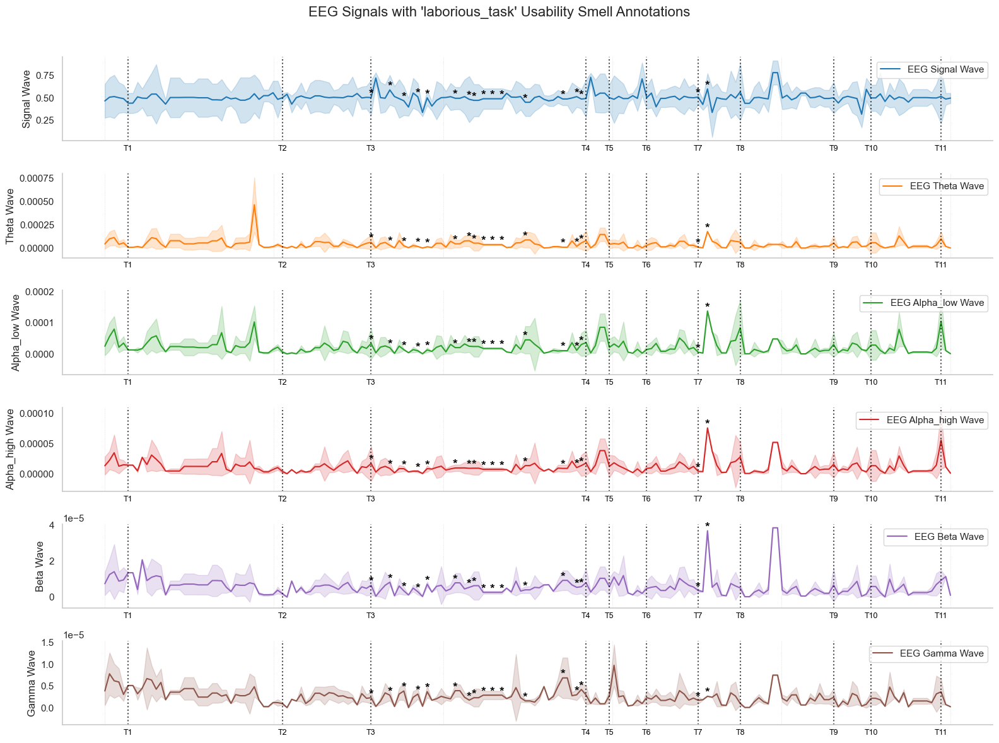

In [69]:
plot_eeg_with_smells(df_all, eeg_waves, network='SN_2', username='L28', smell_to_study='laborious_task')

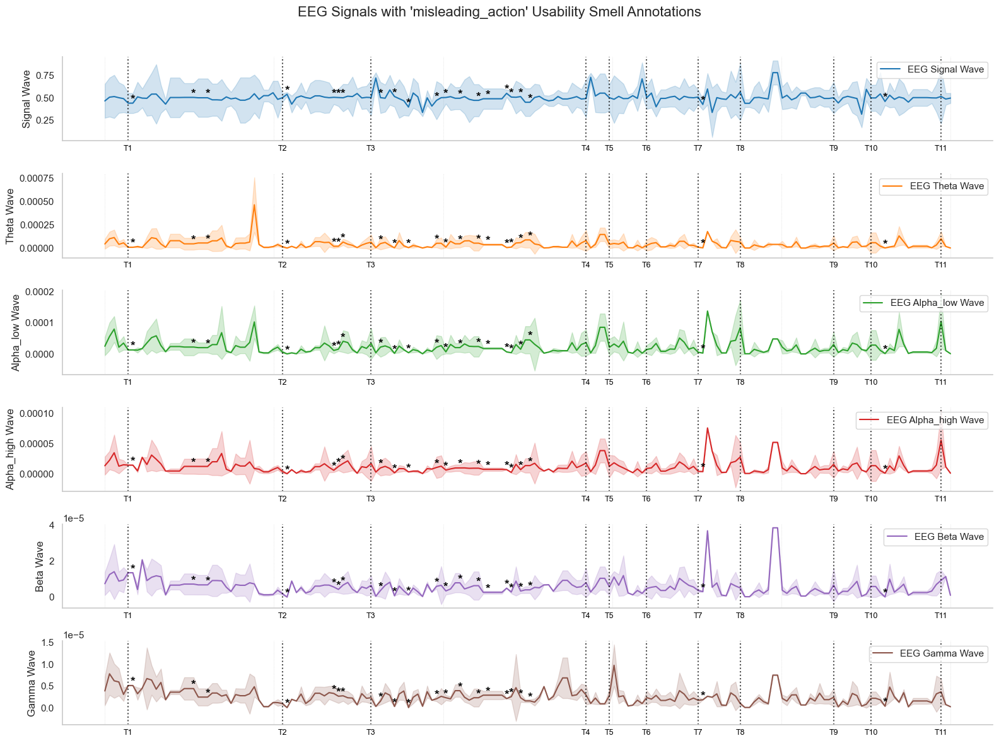

In [70]:
plot_eeg_with_smells(df_all, eeg_waves, network='SN_2', username='L28', smell_to_study='misleading_action')

## Face Emotions

### Face with EEG

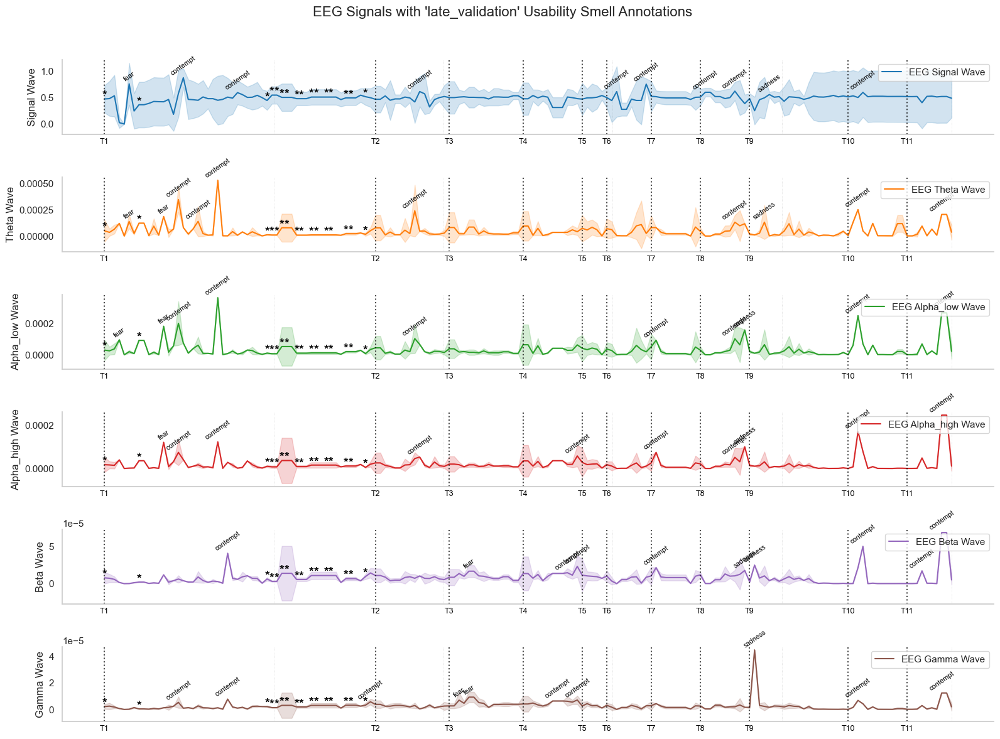

In [71]:
from scipy.signal import find_peaks

# Function to plot EEG waves and annotate smells, now with task_id changes marked and most frequent emotions
def plot_eeg_with_smells(df_tmp, waves, network='SN_1', username='P10', smell_to_study='late_validation', k=3, colors=None):
    fig, axes = plt.subplots(nrows=len(waves), ncols=1, figsize=(16, 12), sharex=True)

    # Sample data filtering for specific user and network (already done in df_tmp)
    df = df_tmp[(df_tmp['network'] == network) & (df_tmp['username'] == username)].copy()
    df = df[[
        'pid', 'eid', 'rid', 'srid',  
        'task_id', 'event_face_avg_most_likely', 'event_face_avg_most_freq',
        'episode_total_duration', 'episode_total_events', 'event_duration', 
        'episode_bit_eeg_signal_avg',  
        'labels_union', 'labels_inter',
        'event_bit_eeg_signal_avg', 'event_bit_eeg_theta_avg', 'event_bit_eeg_alpha_low_avg',
        'event_bit_eeg_alpha_high_avg', 'event_bit_eeg_beta_avg', 'event_bit_eeg_gamma_avg',
        'event_bit_eeg_signal_std', 'event_bit_eeg_theta_std', 'event_bit_eeg_alpha_low_std',
        'event_bit_eeg_alpha_high_std', 'event_bit_eeg_beta_std', 'event_bit_eeg_gamma_std'
    ]]
    
    # Convert labels_union from string representation of list to actual list
    df['labels_union'] = df['labels_union'].apply(lambda x: str_to_list(x))

    # Ensure 'event_face_avg_most_likely' is an integer
    df['event_face_avg_most_likely'] = df['event_face_avg_most_likely'].astype(int)

    # Emotion mapping
    emotion_map = {0: "anger", 1: "disgust", 2: "fear", 3: "enjoyment", 4: "contempt", 5: "sadness", 6: "surprise"}
    
    # Ensure we get a list of axes, even if there's only one subplot
    if len(waves) == 1:
        axes = [axes]
    
    # Default colors if none provided
    if not colors:
        colors = sns.color_palette("tab10", len(waves))
    
    # Identify the x positions where task_id changes
    task_change_indices = df['task_id'].ne(df['task_id'].shift()).cumsum()

    for i, wave in enumerate(waves):
        ax = axes[i]
        wave_col = colors[i]

        # Plot the EEG signal for the current wave
        sns.lineplot(x=df['srid'], y=df[f'event_bit_eeg_{wave}_avg'], ax=ax, color=wave_col, label=f"EEG {wave.capitalize()} Wave")
        
        # Plot shaded region for standard deviation
        if f'event_bit_eeg_{wave}_std' in df.columns:
            ax.fill_between(df['srid'], 
                            df[f'event_bit_eeg_{wave}_avg'] - df[f'event_bit_eeg_{wave}_std'],
                            df[f'event_bit_eeg_{wave}_avg'] + df[f'event_bit_eeg_{wave}_std'],
                            color=wave_col, alpha=0.2)


        # Find top K peaks in the EEG signal
        eeg_signal = df[f'event_bit_eeg_{wave}_avg'].values
        peaks, _ = find_peaks(eeg_signal)

        # Get the top K peaks based on their values
        if len(peaks) > k:
            peak_values = eeg_signal[peaks]
            top_k_peaks_idx = peaks[peak_values.argsort()[-k:]]  # Get indices of the top K peaks
        else:
            top_k_peaks_idx = peaks  # Use all peaks if fewer than K

        # Plot emotions at top K peaks
        for peak_idx in top_k_peaks_idx:
            srid_peak = df.iloc[peak_idx]['srid']
            peak_value = df.iloc[peak_idx][f'event_bit_eeg_{wave}_avg']
            most_likely_emotion = df.iloc[peak_idx]['event_face_avg_most_likely']
            emotion_name = emotion_map[most_likely_emotion]

            # Add emotion name at the top of each peak
            ax.text(srid_peak, peak_value + 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0]),
                    emotion_name, color='black', fontsize=8, rotation=35, ha='center', va='bottom')
        

        prev_srids = set()
        
        # Adding usability smell annotations as markers on the plot
        for idx, row in df.iterrows():
            if row['labels_union']:
                for label in row['labels_union']:

                    if smell_to_study == 'all':
                        if 'none' in label or row['srid'] in prev_srids:
                            continue
                            
                        prev_srids.add(row['srid'])
                    
                    else:
                        if 'none' in label or smell_to_study not in label:
                            continue
                    
                    ax.annotate(
                        '*',
                        (row['srid'], row[f'event_bit_eeg_{wave}_avg']),  # Place the marker at the correct point
                        textcoords="offset points",
                        xytext=(0, 0),  # Offset to avoid overlap
                        ha='center',
                        color='black',
                        fontsize=14,
                        fontweight='bold'
                    )
        
        # Mark the task_id changes with vertical lines and xticks, and add most frequent emotion
        previous_task = None
        for task_id, group in df.groupby('task_id'):
            if task_id == 0:  # Skip task_id 0
                continue
            
            # Mark task changes with vertical lines
            start_srid = group['srid'].min()
            end_srid = group['srid'].max()
            mid_srid = (start_srid + end_srid) / 2  # Middle of the task

            # Plot vertical line
            ax.axvline(x=start_srid, color='black', linestyle=':', alpha=0.7)

            # Add task label
            ax.text(start_srid, ax.get_ylim()[0] - 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0]), 
                    f"T{task_id}", color='black', fontsize=9, ha='center', va='top')

            # Get most frequent emotion for the task
            # most_frequent_emotion = group['event_face_avg_most_likely'].mode()[0]
            # most_frequent_emotion = group['event_face_avg_most_freq'].mode()[0]
            # emotion_name = emotion_map[most_frequent_emotion]

            # Add emotion name in the middle of the task
            # ax.text(mid_srid, ax.get_ylim()[1] + 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0]), 
            #         emotion_name, color='black', fontsize=9, rotation=35, ha='center', va='bottom')
        
        # Set axis labels and title for each subplot
        ax.set_ylabel(f"{wave.capitalize()} Wave")
        ax.set_xticklabels([])
        ax.legend(loc="upper right")
    
    # Set a common xlabel and title for the entire figure
    axes[-1].set_xlabel("")
    fig.suptitle(f"EEG Signals with '{smell_to_study}' Usability Smell Annotations", fontsize=16)
    
    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f'new_plots/eeg_task_face_k{k}_{smell_to_study}.pdf', bbox_inches='tight', dpi=300)

# Example EEG waves to plot
eeg_waves = ['signal', 'theta', 'alpha_low', 'alpha_high', 'beta', 'gamma']

# Call the plotting function
plot_eeg_with_smells(df_all, eeg_waves, network='SN_2', username='L14', smell_to_study='late_validation', k=10)

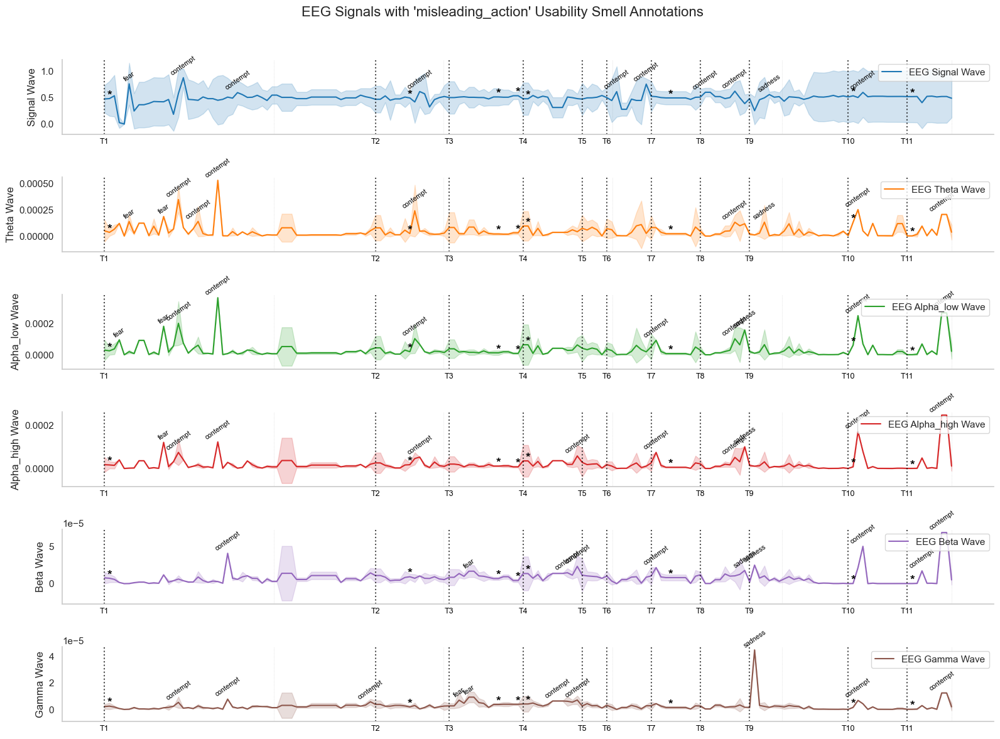

In [72]:
plot_eeg_with_smells(df_all, eeg_waves, network='SN_2', username='L14', smell_to_study='misleading_action', k=10)

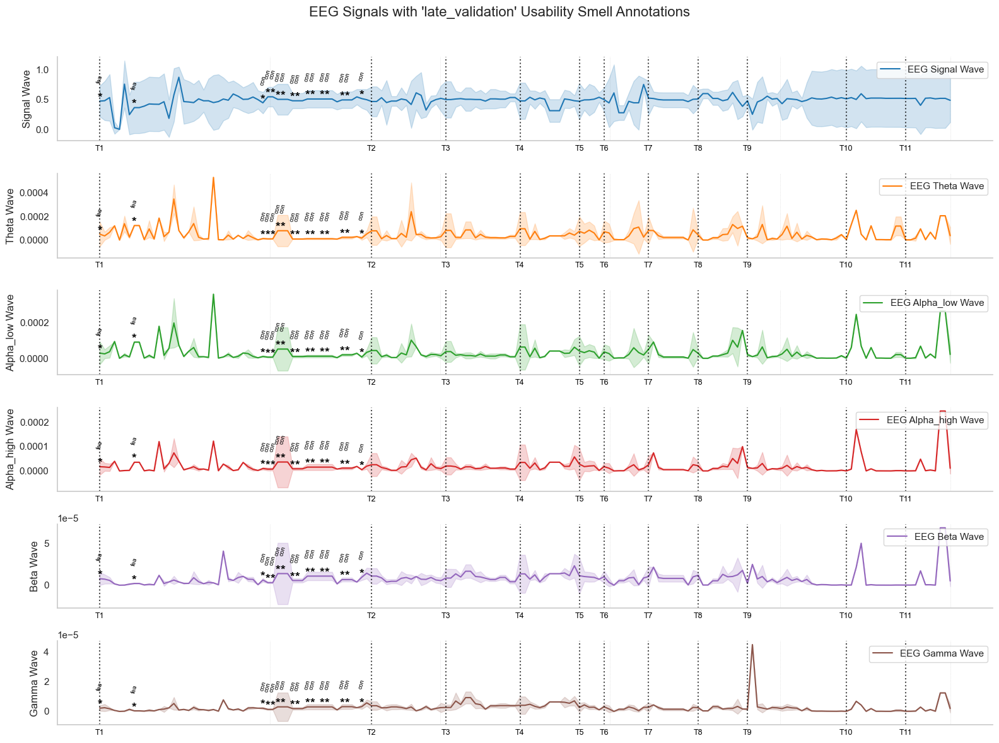

In [73]:
from scipy.signal import find_peaks

# Function to plot EEG waves and annotate smells, now with task_id changes marked and most frequent emotions
def plot_eeg_with_smells(df_tmp, waves, network='SN_1', username='P10', smell_to_study='late_validation', k=3, emo_for_smells=False, colors=None):
    fig, axes = plt.subplots(nrows=len(waves), ncols=1, figsize=(16, 12), sharex=True)

    # Sample data filtering for specific user and network
    df = df_tmp[(df_tmp['network'] == network) & (df_tmp['username'] == username)].copy()
    df = df[[
        'pid', 'eid', 'rid', 'srid',  
        'task_id', 'event_face_avg_most_likely', 'event_face_avg_most_freq',
        'episode_total_duration', 'episode_total_events', 'event_duration', 
        'episode_bit_eeg_signal_avg',  
        'labels_union', 'labels_inter',
        'event_bit_eeg_signal_avg', 'event_bit_eeg_theta_avg', 'event_bit_eeg_alpha_low_avg',
        'event_bit_eeg_alpha_high_avg', 'event_bit_eeg_beta_avg', 'event_bit_eeg_gamma_avg',
        'event_bit_eeg_signal_std', 'event_bit_eeg_theta_std', 'event_bit_eeg_alpha_low_std',
        'event_bit_eeg_alpha_high_std', 'event_bit_eeg_beta_std', 'event_bit_eeg_gamma_std'
    ]]
    
    # Convert labels_union from string representation of list to actual list
    df['labels_union'] = df['labels_union'].apply(lambda x: str_to_list(x))

    # Ensure 'event_face_avg_most_likely' is an integer
    df['event_face_avg_most_likely'] = df['event_face_avg_most_likely'].astype(int)

    # Emotion mapping
    emotion_map = {0: "anger", 1: "disgust", 2: "fear", 3: "enjoyment", 4: "contempt", 5: "sadness", 6: "surprise"}
    
    # Ensure we get a list of axes, even if there's only one subplot
    if len(waves) == 1:
        axes = [axes]
    
    # Default colors if none provided
    if not colors:
        colors = sns.color_palette("tab10", len(waves))
    
    for i, wave in enumerate(waves):
        ax = axes[i]
        wave_col = colors[i]

        # Plot the EEG signal for the current wave
        sns.lineplot(x=df['srid'], y=df[f'event_bit_eeg_{wave}_avg'], ax=ax, color=wave_col, label=f"EEG {wave.capitalize()} Wave")
        
        # Plot shaded region for standard deviation
        if f'event_bit_eeg_{wave}_std' in df.columns:
            ax.fill_between(df['srid'], 
                            df[f'event_bit_eeg_{wave}_avg'] - df[f'event_bit_eeg_{wave}_std'],
                            df[f'event_bit_eeg_{wave}_avg'] + df[f'event_bit_eeg_{wave}_std'],
                            color=wave_col, alpha=0.2)


        # Find top K peaks in the EEG signal
        if k > 0:
            eeg_signal = df[f'event_bit_eeg_{wave}_avg'].values
            peaks, _ = find_peaks(eeg_signal)
    
            # Get the top K peaks based on their values
            if len(peaks) > k:
                peak_values = eeg_signal[peaks]
                top_k_peaks_idx = peaks[peak_values.argsort()[-k:]]  # Get indices of the top K peaks
            else:
                top_k_peaks_idx = peaks  # Use all peaks if fewer than K
    
            # Plot emotions at top K peaks
            for peak_idx in top_k_peaks_idx:
                srid_peak = df.iloc[peak_idx]['srid']
                peak_value = df.iloc[peak_idx][f'event_bit_eeg_{wave}_avg']
                most_likely_emotion = df.iloc[peak_idx]['event_face_avg_most_likely']
                emotion_name = emotion_map[most_likely_emotion]
    
                # Add emotion name at the top of each peak
                ax.text(srid_peak, peak_value + 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0]),
                        emotion_name, color='black', fontsize=8, rotation=35, ha='center', va='bottom')
        

        prev_srids = set()
        
        # Adding usability smell annotations as markers on the plot
        for idx, row in df.iterrows():
            if row['labels_union']:
                for label in row['labels_union']:

                    if smell_to_study == 'all':
                        if 'none' in label or row['srid'] in prev_srids:
                            continue
                        prev_srids.add(row['srid'])
                    else:
                        if 'none' in label or smell_to_study not in label:
                            continue

                    # Plot the * symbol for the smell
                    ax.annotate(
                        '*',
                        (row['srid'], row[f'event_bit_eeg_{wave}_avg']),  # Place the marker at the correct point
                        textcoords="offset points",
                        xytext=(0, 0),  # Offset to avoid overlap
                        ha='center',
                        color='black',
                        fontsize=14,
                        fontweight='bold'
                    )

                    if emo_for_smells:
                        # Get the emotion at the smell's position
                        most_likely_emotion = row['event_face_avg_most_likely']
                        emotion_name = emotion_map[most_likely_emotion]
                        emotion_name = emotion_name[:3]
    
                        # Plot the emotion string above the * symbol with rotation=90
                        ax.text(row['srid'], row[f'event_bit_eeg_{wave}_avg'] + 0.2 * (ax.get_ylim()[1] - ax.get_ylim()[0]),
                                emotion_name, color='black', fontsize=7, rotation=75, ha='center', va='bottom')
        
        # Mark the task_id changes with vertical lines and xticks, and add most frequent emotion
        previous_task = None
        for task_id, group in df.groupby('task_id'):
            if task_id == 0:  # Skip task_id 0
                continue
            
            # Mark task changes with vertical lines
            start_srid = group['srid'].min()
            end_srid = group['srid'].max()
            mid_srid = (start_srid + end_srid) / 2  # Middle of the task

            # Plot vertical line
            ax.axvline(x=start_srid, color='black', linestyle=':', alpha=0.7)

            # Add task label
            ax.text(start_srid, ax.get_ylim()[0] - 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0]), 
                    f"T{task_id}", color='black', fontsize=9, ha='center', va='top')

        
        # Set axis labels and title for each subplot
        ax.set_ylabel(f"{wave.capitalize()} Wave")
        ax.set_xticklabels([])
        ax.legend(loc="upper right")
    
    # Set a common xlabel and title for the entire figure
    axes[-1].set_xlabel("")
    fig.suptitle(f"EEG Signals with '{smell_to_study}' Usability Smell Annotations", fontsize=16)
    
    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f'new_plots/eeg_task_face_peaks_k{k}_{smell_to_study}.pdf', bbox_inches='tight', dpi=300)

# Example EEG waves to plot
eeg_waves = ['signal', 'theta', 'alpha_low', 'alpha_high', 'beta', 'gamma']

# Call the plotting function
plot_eeg_with_smells(df_all, eeg_waves, network='SN_2', username='L14', smell_to_study='late_validation', emo_for_smells=True, k=0)

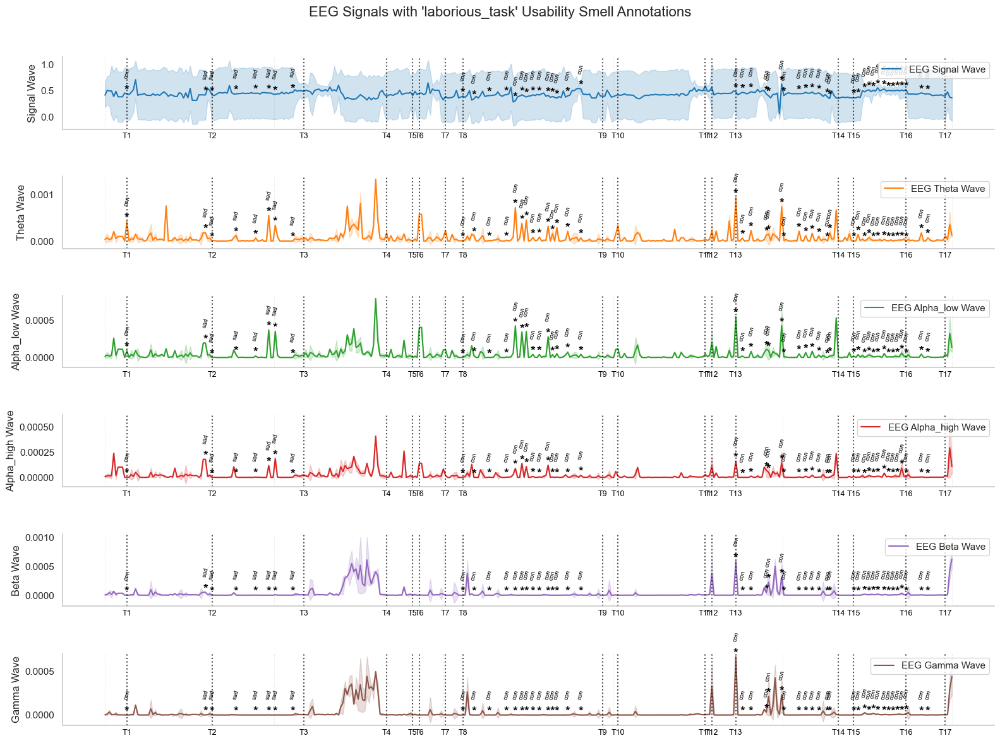

In [74]:
plot_eeg_with_smells(df_all, eeg_waves, network='SN_1', username='P14', smell_to_study='laborious_task', emo_for_smells=True, k=0)

### Face for each event type

<Figure size 1400x1000 with 0 Axes>

<Figure size 640x480 with 0 Axes>

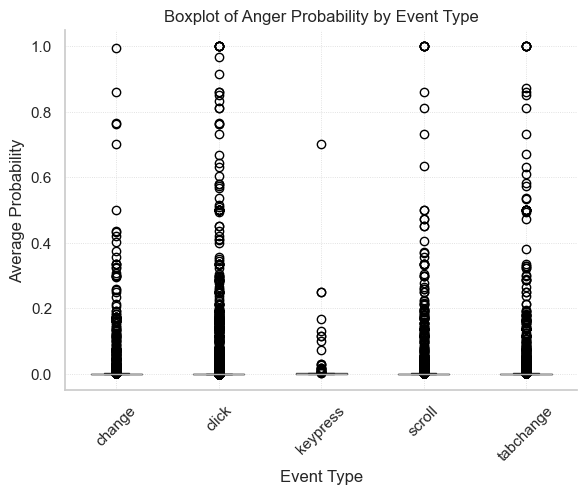

<Figure size 640x480 with 0 Axes>

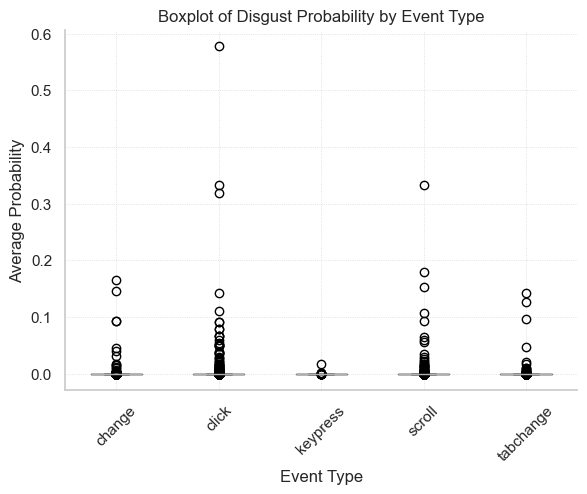

<Figure size 640x480 with 0 Axes>

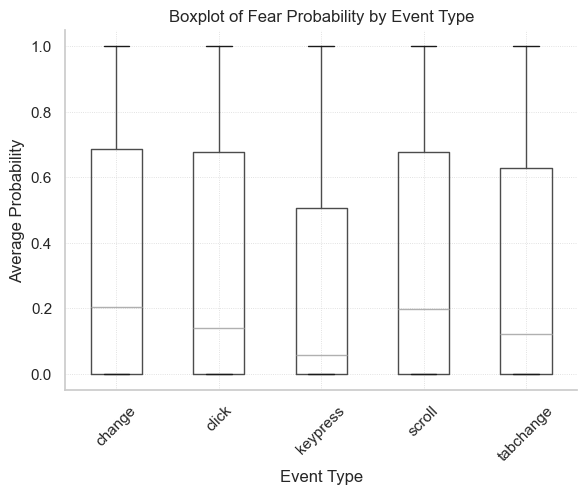

<Figure size 640x480 with 0 Axes>

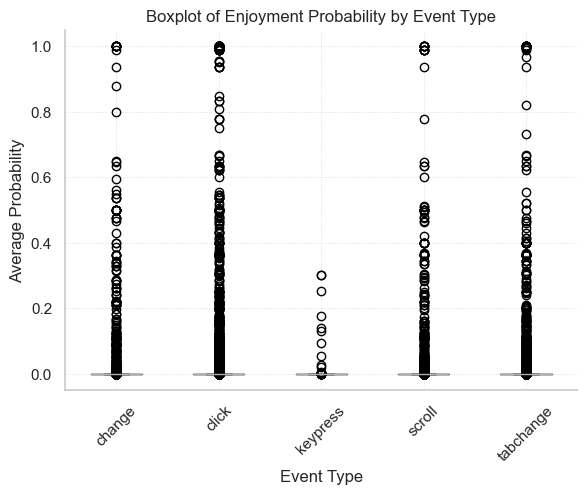

<Figure size 640x480 with 0 Axes>

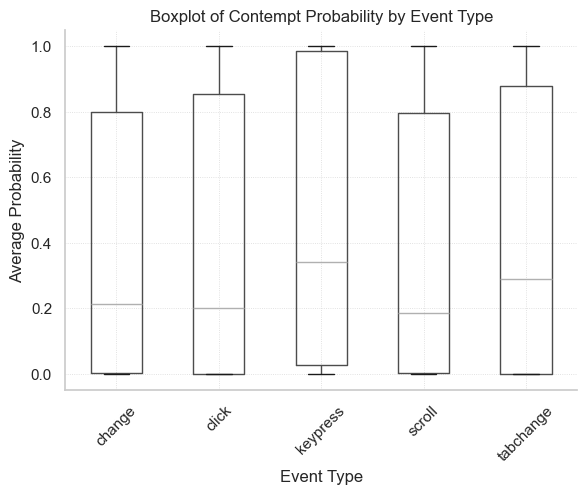

<Figure size 640x480 with 0 Axes>

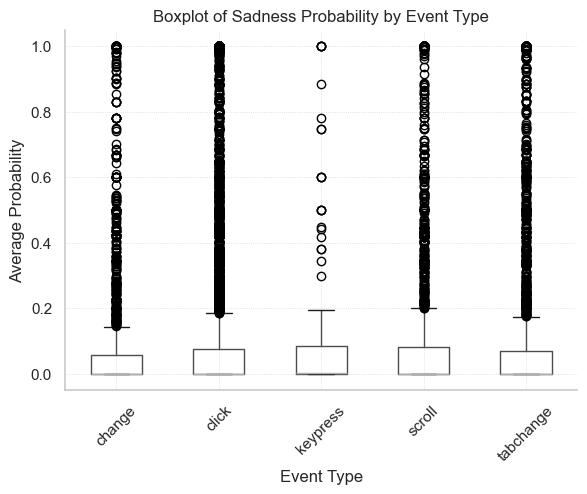

<Figure size 640x480 with 0 Axes>

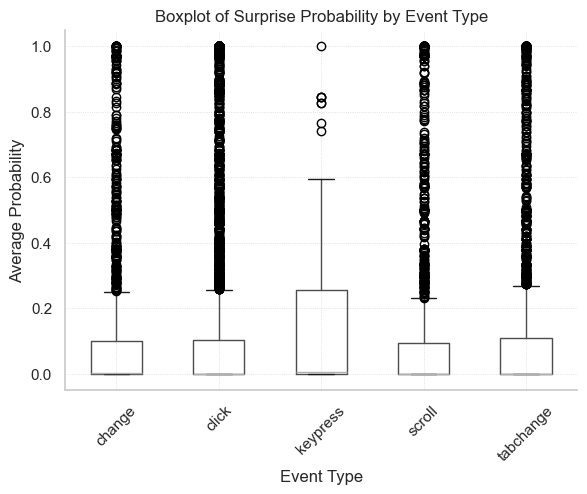

In [75]:
# Columns specific to face emotions for event types
emotion_columns = [
    'event_face_avg_0_anger_proba', 
    'event_face_avg_1_disgust_proba', 
    'event_face_avg_2_fear_proba', 
    'event_face_avg_3_enjoyment_proba', 
    'event_face_avg_4_contempt_proba', 
    'event_face_avg_5_sadness_proba', 
    'event_face_avg_6_surprise_proba'
]

# Melt the DataFrame to facilitate boxplot creation by event type
df_emotions = df_all.melt(id_vars=['event'], value_vars=emotion_columns, 
                          var_name='emotion', value_name='average_probability')

# Rename emotion labels for better readability
emotion_labels = {
    'event_face_avg_0_anger_proba': 'Anger',
    'event_face_avg_1_disgust_proba': 'Disgust',
    'event_face_avg_2_fear_proba': 'Fear',
    'event_face_avg_3_enjoyment_proba': 'Enjoyment',
    'event_face_avg_4_contempt_proba': 'Contempt',
    'event_face_avg_5_sadness_proba': 'Sadness',
    'event_face_avg_6_surprise_proba': 'Surprise'
}

df_emotions['emotion'] = df_emotions['emotion'].map(emotion_labels)

# Plot boxplots for each emotion by event type
plt.figure(figsize=(14, 10))
for emotion in emotion_labels.values():
    plt.figure()
    df_subset = df_emotions[df_emotions['emotion'] == emotion]
    df_subset.boxplot(column='average_probability', by='event')
    plt.title(f'Boxplot of {emotion} Probability by Event Type')
    plt.suptitle('')
    plt.xlabel('Event Type')
    plt.ylabel('Average Probability')
    plt.xticks(rotation=45)
    plt.show()

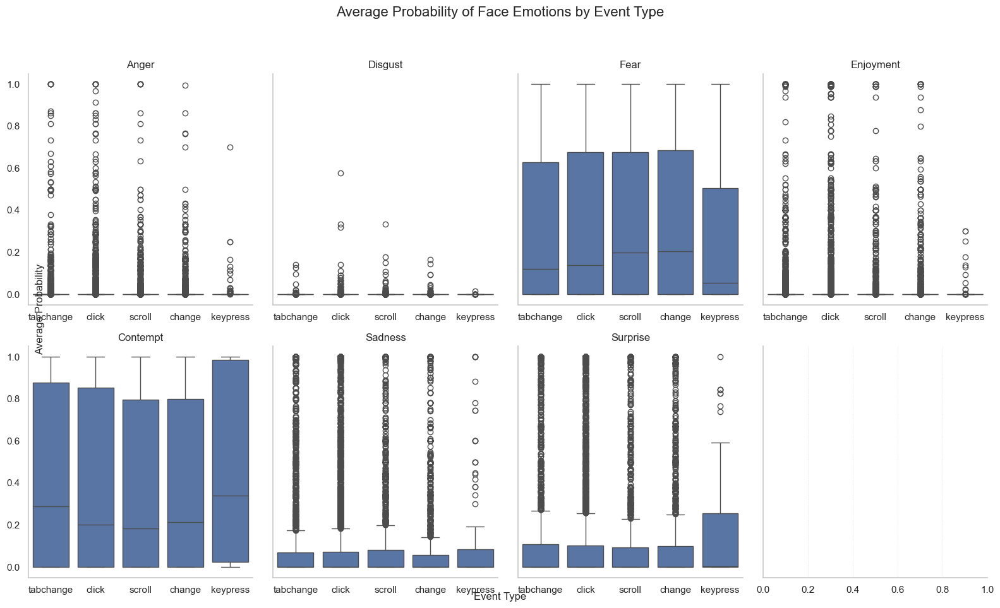

In [76]:
# Create a figure with subplots for each emotion
fig, axes = plt.subplots(2, 4, figsize=(16, 10), sharey=True)
fig.suptitle("Average Probability of Face Emotions by Event Type", fontsize=16)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Plot each emotion as a subplot
for i, emotion in enumerate(emotion_labels.values()):
    sns.boxplot(data=df_emotions[df_emotions['emotion'] == emotion], x='event', y='average_probability', ax=axes[i])
    axes[i].set_title(emotion)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

# Add axis labels to the whole figure
fig.text(0.5, 0.04, 'Event Type', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Average Probability', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### 2. Violin Plot for Distribution Insight

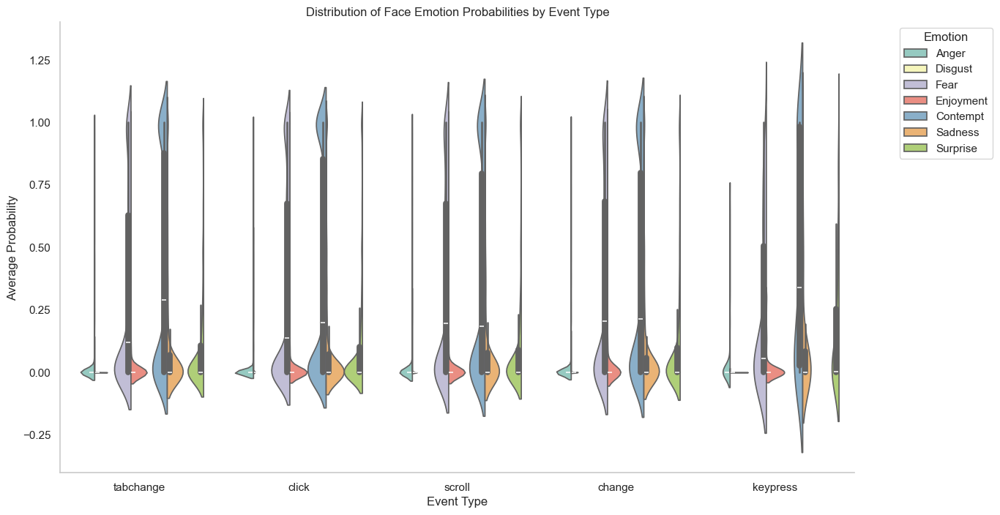

In [77]:
# Set up a single figure for all violin plots, grouped by emotion and event type
plt.figure(figsize=(14, 8))
sns.violinplot(data=df_emotions, x='event', y='average_probability', hue='emotion', split=True, palette="Set3")
plt.title("Distribution of Face Emotion Probabilities by Event Type")
plt.xlabel("Event Type")
plt.ylabel("Average Probability")
plt.legend(title='Emotion', bbox_to_anchor=(1.05, 1), loc='upper left')

#plt.xticks(rotation=45)
plt.show()


### Face emotion probability in each task

Just to SN1 and SN2 (SN3 do not have face)

In [78]:
# List of face emotion columns for probability calculations
emotion_columns = [
    'event_face_avg_0_anger_proba', 
    'event_face_avg_1_disgust_proba', 
    'event_face_avg_2_fear_proba', 
    'event_face_avg_3_enjoyment_proba', 
    'event_face_avg_4_contempt_proba', 
    'event_face_avg_5_sadness_proba', 
    'event_face_avg_6_surprise_proba'
]

# Rename for easier interpretation in plots
emotion_labels = {
    'event_face_avg_0_anger_proba': 'Anger',
    'event_face_avg_1_disgust_proba': 'Disgust',
    'event_face_avg_2_fear_proba': 'Fear',
    'event_face_avg_3_enjoyment_proba': 'Enjoyment',
    'event_face_avg_4_contempt_proba': 'Contempt',
    'event_face_avg_5_sadness_proba': 'Sadness',
    'event_face_avg_6_surprise_proba': 'Surprise'
}

# Map labels for readability
df_emotions = df_all[["network", "task_id"] + emotion_columns].rename(columns=emotion_labels)

# Filter to include only SN_1 and SN_2
df_emotions = df_emotions[df_emotions['network'].isin(['SN_1', 'SN_2'])]

# Group by network and task_id, calculating the average probability for each emotion
grouped_df = df_emotions.groupby(['network', 'task_id']).mean().reset_index()

# Convert the probabilities to percentages
grouped_df[list(emotion_labels.values())] = grouped_df[list(emotion_labels.values())] * 100

# Display the table with the percentages for each emotion
# Round to one decimal place for cleaner presentation
grouped_df = grouped_df.round(1)


# Or, if you're using a Jupyter Notebook, display it as a DataFrame for better readability:
from IPython.display import display
display(grouped_df)




,network,task_id,Anger,Disgust,Fear,Enjoyment,Contempt,Sadness,Surprise
0,SN_1,0,3.0,0.1,38.1,2.0,42.8,6.4,7.7
1,SN_1,1,2.0,0.0,43.2,2.5,30.8,12.0,9.4
2,SN_1,2,1.4,0.0,37.2,1.8,31.4,13.8,14.4
3,SN_1,3,1.5,0.1,38.8,0.4,34.3,18.3,6.6
4,SN_1,4,2.1,0.1,44.1,0.6,32.6,9.5,11.1
5,SN_1,5,0.8,0.0,28.7,0.7,46.2,5.9,17.7
6,SN_1,6,2.1,0.5,39.3,1.8,30.6,13.0,12.7
7,SN_1,7,2.6,0.2,38.6,0.5,30.8,17.6,9.7
8,SN_1,8,1.0,0.2,31.5,0.7,46.3,12.3,8.0
9,SN_1,9,0.2,0.1,36.7,1.1,28.7,25.7,7.6


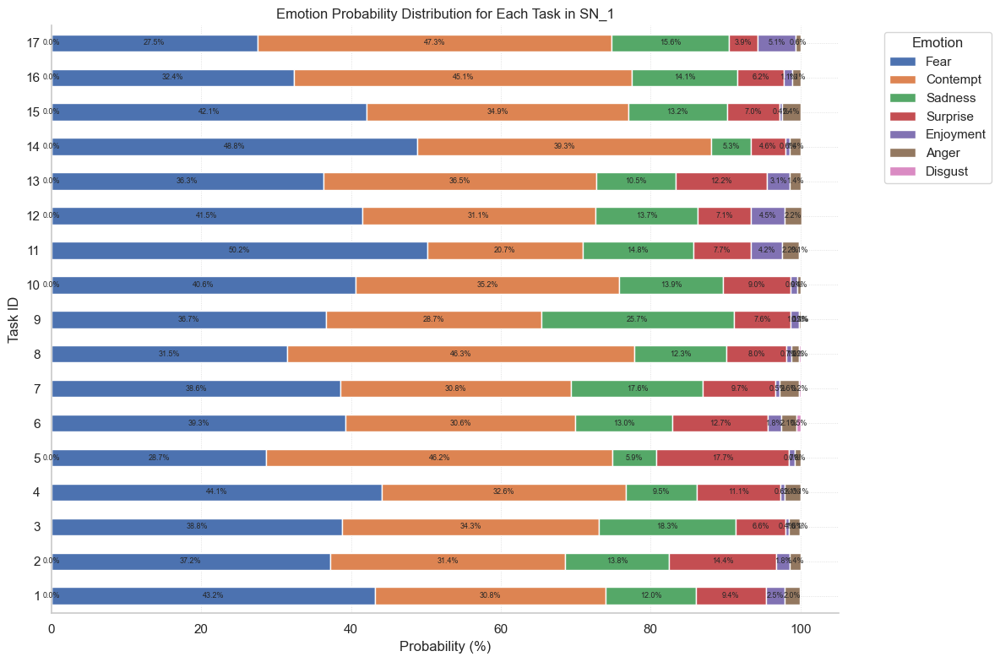

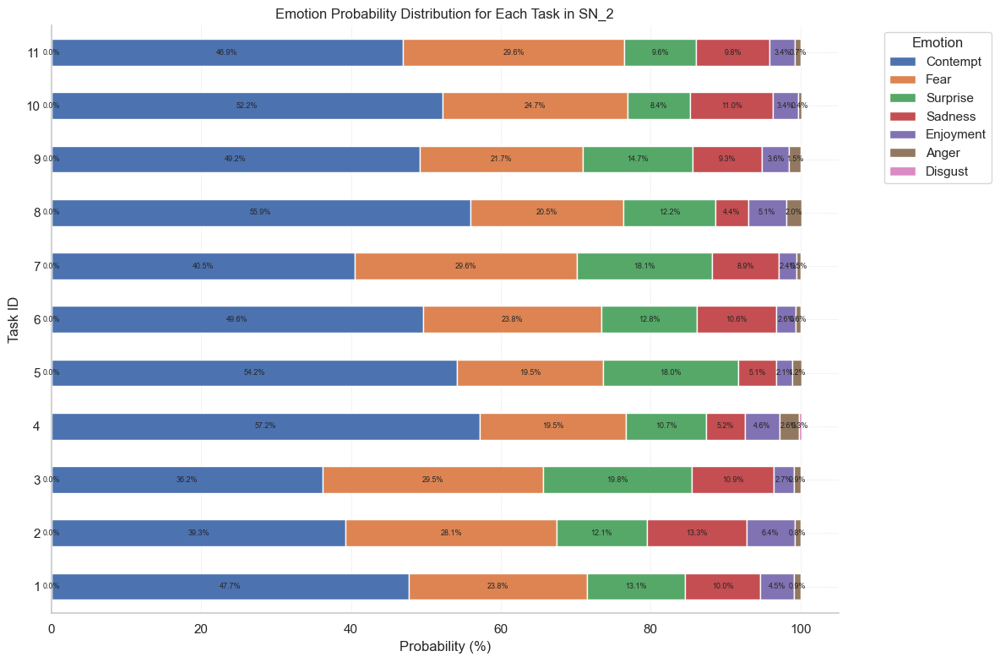

In [79]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the DataFrame to include only networks 'SN_1' and 'SN_2' and exclude task_id = 0
df_filtered = grouped_df[(grouped_df['network'].isin(['SN_1', 'SN_2'])) & (grouped_df['task_id'] != 0)]

# Calculate the average percentage for each emotion within each network to determine the order
ordered_emotions = {}
for network in ['SN_1', 'SN_2']:
    df_network = df_filtered[df_filtered['network'] == network]
    # Calculate average emotion percentage across all tasks for this network
    avg_emotion_percentages = df_network[emotion_labels.values()].mean().sort_values(ascending=False)
    # Store the ordered list of emotions for this network
    ordered_emotions[network] = avg_emotion_percentages.index.tolist()

# Plot stacked horizontal bar plots for each network (only SN_1 and SN_2)
for network in ['SN_1', 'SN_2']:
    # Filter data for the specific network and reorder task_id in ascending order
    df_network = df_filtered[df_filtered['network'] == network].sort_values(by='task_id')
    
    # Set 'task_id' as the index for easier plotting
    df_network.set_index('task_id', inplace=True)
    
    # Reorder columns based on calculated order
    df_network = df_network[ordered_emotions[network]]
    
    # Plot a stacked horizontal bar chart
    ax = df_network.plot(kind='barh', stacked=True, figsize=(12, 8))
    
    plt.title(f"Emotion Probability Distribution for Each Task in {network}")
    plt.xlabel("Probability (%)")
    plt.ylabel("Task ID")
    plt.legend(title="Emotion", bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Display percentages on each segment
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', label_type='center', fontsize=6.5)
    
    plt.tight_layout()
    plt.show()


### Face emotion distribution according Smells

In [80]:
# Filter the DataFrame to include only the relevant smells in `labels_union`
# Assume each row in `labels_union` can contain multiple smells separated by commas
df_smells = df_all.dropna(subset=['labels_union'])

# Split and clean the smells
df_smells['smells'] = df_smells['labels_union'].map(str_to_list)

# Expand rows for each smell to calculate probabilities per smell
df_smells_expanded = df_smells.explode('smells')

# Determine the category for each smell
df_smells_expanded['smell_category'] = df_smells_expanded['smells'].apply(
    lambda x: 'task_level_smells' if x in task_level_smells else (
        'action_level_smells' if x in action_level_smells else 'other'
    )
)

# Filter out rows with 'other' category
df_smells_expanded = df_smells_expanded[df_smells_expanded['smell_category'] != 'other']

# Group by smell category and smell name to calculate average probability for each emotion
emotion_columns = [
    'event_face_avg_0_anger_proba', 'event_face_avg_1_disgust_proba', 'event_face_avg_2_fear_proba',
    'event_face_avg_3_enjoyment_proba', 'event_face_avg_4_contempt_proba',
    'event_face_avg_5_sadness_proba', 'event_face_avg_6_surprise_proba'
]

# Calculate the mean probabilities for each emotion within each smell
emotion_distribution = df_smells_expanded.groupby(['smell_category', 'smells'])[emotion_columns].mean() * 100

# Rename columns for easier readability
emotion_labels = {
    'event_face_avg_0_anger_proba': 'Anger',
    'event_face_avg_1_disgust_proba': 'Disgust',
    'event_face_avg_2_fear_proba': 'Fear',
    'event_face_avg_3_enjoyment_proba': 'Enjoyment',
    'event_face_avg_4_contempt_proba': 'Contempt',
    'event_face_avg_5_sadness_proba': 'Sadness',
    'event_face_avg_6_surprise_proba': 'Surprise'
}
emotion_distribution.rename(columns=emotion_labels, inplace=True)

# Reset the index for easier display and interpretation
emotion_distribution.reset_index(inplace=True)

emotion_distribution

,smell_category,smells,Anger,Disgust,Fear,Enjoyment,Contempt,Sadness,Surprise
0,action_level_smells,misleading_action,1.174852,0.067026,31.332802,2.529925,39.148192,12.661412,13.085790
1,action_level_smells,missing_action_feedback,1.144109,0.033361,34.008905,2.163723,38.520691,10.616071,13.513140
2,action_level_smells,undescriptive_element,0.958599,0.003062,32.200371,2.742458,40.076149,11.484296,12.535065
3,action_level_smells,unnecessary_action,1.821416,0.002251,33.435426,3.776833,37.492116,11.855618,11.616341
4,task_level_smells,cyclic_task,1.697688,0.000903,35.077055,1.444195,36.299761,13.355654,12.124744
5,task_level_smells,high_interaction_distance,0.864968,0.006518,26.895268,1.824396,46.684730,7.773166,15.950954
6,task_level_smells,laborious_task,1.390321,0.003038,29.860898,2.182203,42.694271,11.475830,12.393439
7,task_level_smells,late_validation,1.196538,0.014606,26.802464,1.976192,45.986551,13.315288,10.708361
8,task_level_smells,missing_task_feedback,1.943947,0.002872,34.216747,2.303042,38.246160,13.080217,10.207015
9,task_level_smells,repetition_in_text_fields,2.049640,0.004432,31.408884,2.058992,42.187189,10.851266,11.439597


<Figure size 1000x600 with 0 Axes>

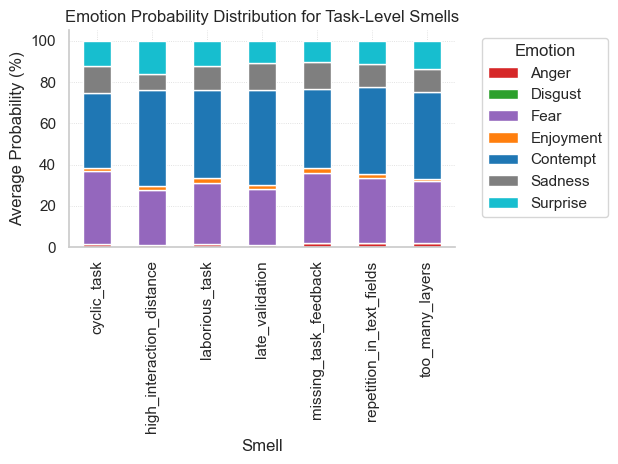

<Figure size 1000x600 with 0 Axes>

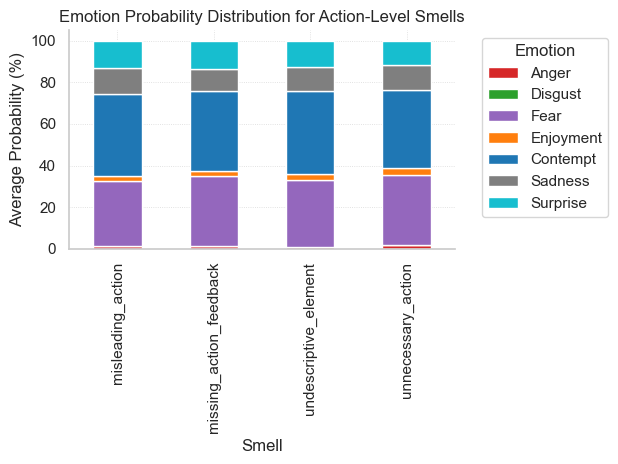

In [81]:
# Define colors for emotions to ensure consistency across both plots
emotion_colors = {
    'Anger': 'tab:red',
    'Disgust': 'tab:green',
    'Fear': 'tab:purple',
    'Enjoyment': 'tab:orange',
    'Contempt': 'tab:blue',
    'Sadness': 'tab:gray',
    'Surprise': 'tab:cyan'
}

# Filter data for task-level and action-level smells
task_level_data = emotion_distribution[emotion_distribution['smell_category'] == 'task_level_smells']
action_level_data = emotion_distribution[emotion_distribution['smell_category'] == 'action_level_smells']

# Plot task-level smells
plt.figure(figsize=(10, 6))
task_level_data.set_index('smells')[emotion_labels.values()].plot(
    kind='bar', stacked=True, color=[emotion_colors[emotion] for emotion in emotion_labels.values()]
)
plt.title("Emotion Probability Distribution for Task-Level Smells")
plt.xlabel("Smell")
plt.ylabel("Average Probability (%)")
plt.legend(title="Emotion", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot action-level smells
plt.figure(figsize=(10, 6))
action_level_data.set_index('smells')[emotion_labels.values()].plot(
    kind='bar', stacked=True, color=[emotion_colors[emotion] for emotion in emotion_labels.values()]
)
plt.title("Emotion Probability Distribution for Action-Level Smells")
plt.xlabel("Smell")
plt.ylabel("Average Probability (%)")
plt.legend(title="Emotion", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


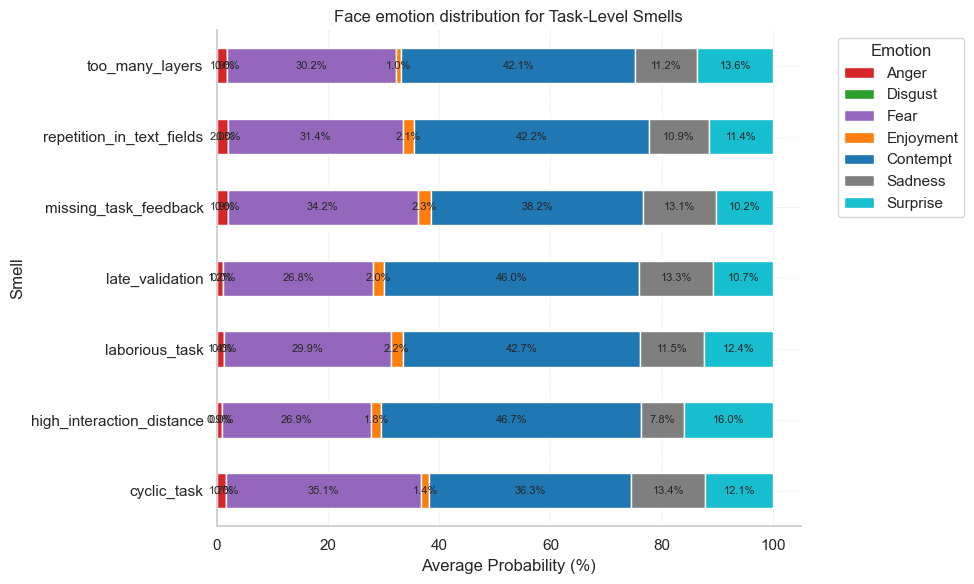

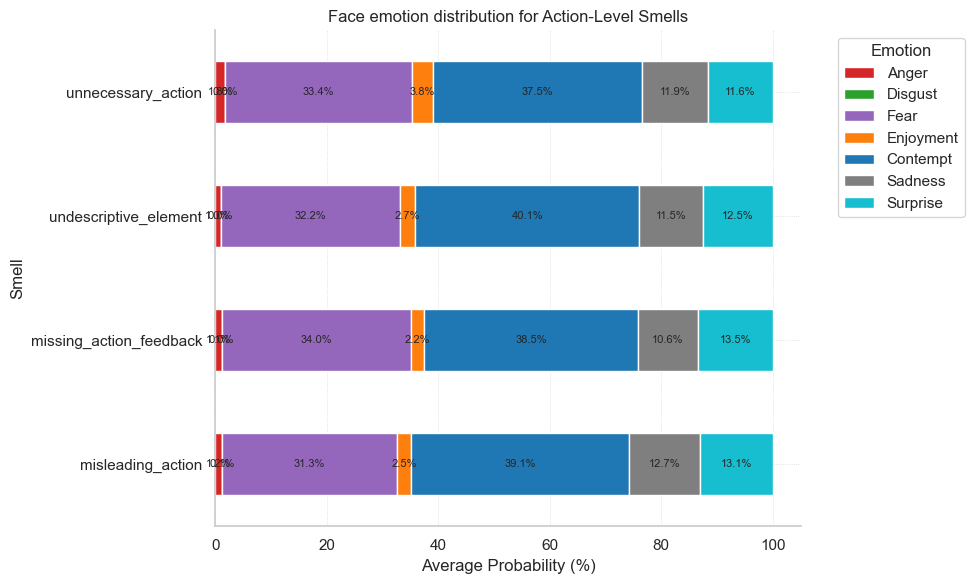

In [106]:
import matplotlib.pyplot as plt

# Define colors for emotions to ensure consistency across both plots
emotion_colors = {
    'Anger': 'tab:red',
    'Disgust': 'tab:green',
    'Fear': 'tab:purple',
    'Enjoyment': 'tab:orange',
    'Contempt': 'tab:blue',
    'Sadness': 'tab:gray',
    'Surprise': 'tab:cyan'
}

# Select only emotion columns
emotion_columns = list(emotion_colors.keys())

# Plot task-level smells in a horizontal stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))
task_level_data.set_index('smells')[emotion_columns].plot(
    kind='barh', stacked=True, color=[emotion_colors[emotion] for emotion in emotion_columns], ax=ax
)
plt.title("Face emotion distribution for Task-Level Smells")
plt.xlabel("Average Probability (%)")
plt.ylabel("Smell")
plt.legend(title="Emotion", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage labels
for container in ax.containers:
    ax.bar_label(container, labels=[f'{v.get_width():.1f}%' for v in container], label_type='center', fontsize=8)

plt.tight_layout()
plt.savefig('new_plots/task_smell_x_face_emotion_distribution.pdf', bbox_inches='tight', dpi=300)

# Plot action-level smells in a horizontal stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))
action_level_data.set_index('smells')[emotion_columns].plot(
    kind='barh', stacked=True, color=[emotion_colors[emotion] for emotion in emotion_columns], ax=ax
)
plt.title("Face emotion distribution for Action-Level Smells")
plt.xlabel("Average Probability (%)")
plt.ylabel("Smell")
plt.legend(title="Emotion", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add percentage labels
for container in ax.containers:
    ax.bar_label(container, labels=[f'{v.get_width():.1f}%' for v in container], label_type='center', fontsize=8)

plt.tight_layout()
plt.savefig('new_plots/action_smell_x_face_emotion_distribution.pdf', bbox_inches='tight', dpi=300)
#plt.show()


---

## SAM Emotions

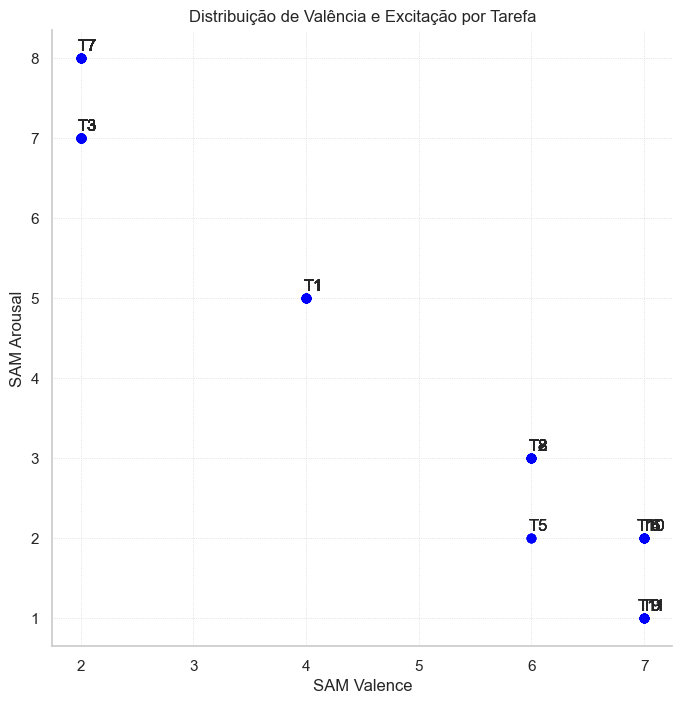

In [99]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


# Filtrar o DataFrame para o usuário desejado (substitua 'user_id' pelo identificador correto)
usuario_df = df_all[df_all['username'] == 'L21']

# Para fins de exemplo, vamos usar algumas colunas do df_all
# substitua `usuario_df` por `df_all` se quiser utilizar todos os dados ou filtro para um usuário específico
task_ids = usuario_df['task_id']
sam_valence = usuario_df['sam_valence']
sam_arousal = usuario_df['sam_arousal']

# Configuração do gráfico de dispersão
fig, ax = plt.subplots(figsize=(8, 8))
scatter = ax.scatter(sam_valence, sam_arousal, c='blue', label='Tarefas')
ax.set_xlabel("SAM Valence")
ax.set_ylabel("SAM Arousal")
ax.set_title("Distribuição de Valência e Excitação por Tarefa")
ax.grid(True)


# Adicionar rótulos das tarefas
for i, task_id in enumerate(task_ids):
    ax.annotate(f"T{task_id}", (sam_valence.iloc[i], sam_arousal.iloc[i]), 
                textcoords="offset points", xytext=(5, 5), ha='center',)

# Mostrar o gráfico
plt.show()


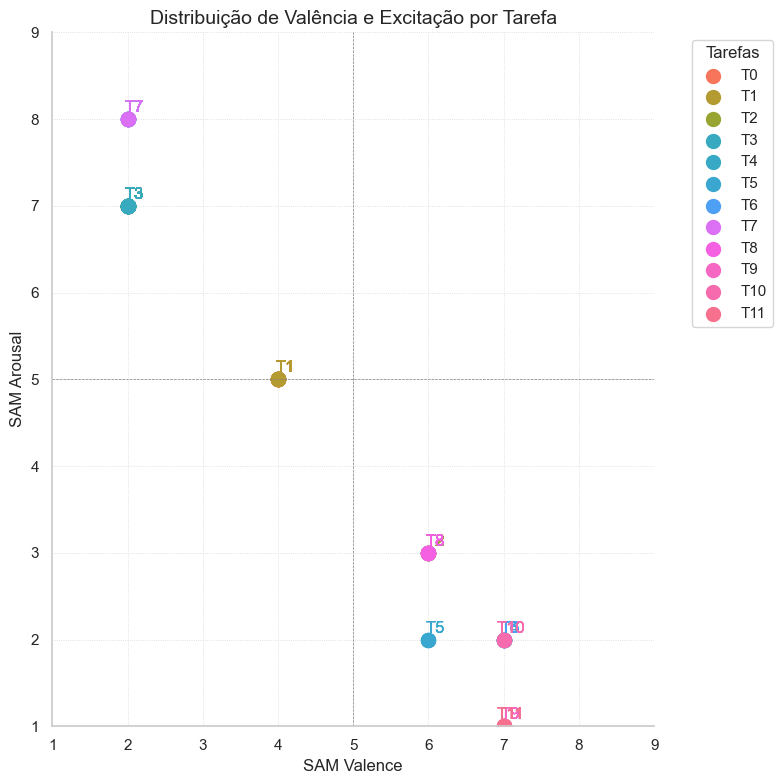

In [107]:
# Filtrar o DataFrame para o usuário desejado (substitua 'L20' pelo identificador do usuário se necessário)
usuario_df = df_all[df_all['username'] == 'L21']

# Extraindo dados das colunas
task_ids = usuario_df['task_id']
sam_valence = usuario_df['sam_valence']
sam_arousal = usuario_df['sam_arousal']

# Configuração do gráfico de dispersão
fig, ax = plt.subplots(figsize=(8, 8))

# Utilizando uma paleta de cores do seaborn para diferenciar as tarefas
palette = sns.color_palette("husl", len(task_ids))
color_cycle = itertools.cycle(palette)

# Plotando cada ponto com uma cor única e adicionando rótulos
for i, task_id in enumerate(task_ids):
    color = next(color_cycle)
    ax.scatter(sam_valence.iloc[i], sam_arousal.iloc[i], color=color, s=100, label=f"T{task_id}")
    ax.annotate(f"T{task_id}", (sam_valence.iloc[i], sam_arousal.iloc[i]), 
                textcoords="offset points", xytext=(5, 5), ha='center', color=color)

# Centralizando os eixos em 5 e ajustando os limites entre 1 e 9
ax.set_xlim(1, 9)
ax.set_ylim(1, 9)
ax.axhline(5, color='gray', linestyle='--', linewidth=0.5)
ax.axvline(5, color='gray', linestyle='--', linewidth=0.5)

# Rótulos dos eixos e título
ax.set_xlabel("SAM Valence", fontsize=12)
ax.set_ylabel("SAM Arousal", fontsize=12)
ax.set_title("Distribuição de Valência e Excitação por Tarefa", fontsize=14)
ax.grid(True)

# Melhorando a legenda com seaborn
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicatas na legenda
ax.legend(by_label.values(), by_label.keys(), title="Tarefas", bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar o gráfico
plt.tight_layout()
plt.savefig('new_plots/sam_L21.svg', bbox_inches='tight', dpi=300)

